# estimate the impact of c350, c420, c450

In [1]:
import os
import numpy as np
from noah2 import data as D
from noah2 import util as U

In [2]:
import torch

In [3]:
import corner as DFM
# --- plotting ---
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False
%matplotlib inline

In [4]:
cuda = torch.cuda.is_available()
device = ("cuda:0" if cuda else "cpu")

In [5]:
DNoah = D.Noah2()
fema = DNoah._read_data_full(participants=True)

In [6]:
covars = np.array([fema[col] for col in DNoah._columns()[1:8]+['s_c350', 's_c420', 's_c450']]).T
covars[:,2] = np.log10(covars[:,2])
covars[:,3] = np.log10(covars[:,3])

column_labels = np.array(DNoah._column_labels()[1:8] + ['c350', 'c420', 'c450'])

In [7]:
binary_activities = ['c360', 'c520', 'c530', 'c540', 'c610', 'c620', 'c630']

binary_data = np.array([np.array(fema[col]) for col in binary_activities]).T
binary_data = (binary_data > 0).astype(int)

binary_act_codes = np.zeros(len(fema))
for i in range(binary_data.shape[1]): 
    binary_act_codes += 2**i * binary_data[:,i]
    
def uncode(num): 
    act = np.zeros(len(binary_activities)).astype(int)
    while num > 0: 
        ind = int(np.floor(np.log(num)/np.log(2)))
        num = num - 2**ind
        act[ind] = 1
    return act

act_enough_stat = []
for code in np.unique(binary_act_codes): 
    ncomm = np.sum(binary_act_codes == code)
    nzip = len(np.unique(fema['zipcode'][binary_act_codes == code]))
    if nzip < 100: continue
    print(uncode(code))        
    print('%i communities' % ncomm)
    print('%i unique zipcodes' % nzip)
    act_enough_stat.append(code)
    print()

[0 0 0 0 0 0 0]
12737 communities
315 unique zipcodes

[0 1 0 0 0 0 0]
3861 communities
118 unique zipcodes

[0 0 0 1 0 0 0]
4399 communities
113 unique zipcodes

[1 0 0 1 0 0 0]
1935 communities
147 unique zipcodes

[0 1 0 1 0 0 0]
52339 communities
119 unique zipcodes

[1 1 0 1 1 0 0]
2798 communities
112 unique zipcodes

[0 0 0 0 0 0 1]
4971 communities
308 unique zipcodes

[0 1 0 0 0 0 1]
2109 communities
234 unique zipcodes

[0 0 0 1 0 0 1]
1005 communities
119 unique zipcodes

[1 1 0 1 0 0 1]
30175 communities
165 unique zipcodes



## RUCA urban/rural classifications

In [8]:
metro = ((fema['RUCA1'] == 1))# | (fema['RUCA1'] == 2) | (fema['RUCA1'] == 3)) 
micro = ((fema['RUCA1'] == 4) | (fema['RUCA1'] == 5) | (fema['RUCA1'] == 6))
small = ((fema['RUCA1'] == 7) | (fema['RUCA1'] == 8) | (fema['RUCA1'] == 9))
rural = ((fema['RUCA1'] == 10))

In [9]:
print('metropolitan %i, %i unique zipcodes' % (np.sum(metro), len(np.unique(fema['zipcode'][metro]))))
print('micropolitan %i, %i unique zipcodes' % (np.sum(micro), len(np.unique(fema['zipcode'][micro]))))
print('small towns  %i, %i unique zipcodes' % (np.sum(small), len(np.unique(fema['zipcode'][small]))))
print('rural areas  %i, %i unique zipcodes' % (np.sum(rural), len(np.unique(fema['zipcode'][rural]))))

metropolitan 135421, 1876 unique zipcodes
micropolitan 17890, 195 unique zipcodes
small towns  4188, 59 unique zipcodes
rural areas  880, 59 unique zipcodes


In [10]:
def downsample(select): 
    zuniq, iuniq, nuniq = np.unique(fema['zipcode'][select], return_index=True, return_counts=True)

    n_repeat = 1
    remove = np.zeros(np.sum(select)).astype(bool)

    for z in zuniq: 
        is_zip = (np.array(fema['zipcode'])[select] == z)

        if np.sum(is_zip) > n_repeat:
            _remove = np.random.choice(np.arange(np.sum(is_zip)), np.sum(is_zip) - n_repeat, replace=False)
            remove[np.arange(np.sum(select))[is_zip][_remove]] = True
    return ~remove

In [11]:
def load_Qphi_support(binary): 
    ''' load Qphi(X) for binary activity combination
    '''
    Qphi = torch.load('../dat/qphi/noah2.Qphi_support.binary%i.prelim.pt' % int(binary), map_location=device)
    return Qphi

def check_support(binary, X, nsample=10000, threshold=0.95, verbose=False): 
    ''' check support for covariates X
    '''
    X = np.atleast_2d(X).copy()
    # preprocess X
    X[:,0] = U.inv_cdf_transform(X[:,0], [-1e-3, 1500])
    X[:,1] = U.inv_cdf_transform(X[:,1], [-1e-3, 10])
    X[:,2] = U.inv_cdf_transform(X[:,2], [3, 6])        
    X[:,3] = U.inv_cdf_transform(X[:,3], [1, 6])        
    X[:,4] = U.inv_cdf_transform(X[:,4], [-1e-3, 1+1e-3])            
    X[:,5] = U.inv_cdf_transform(X[:,5], [-1e-3, 1+1e-3])            
    X[:,6] = U.inv_cdf_transform(X[:,6], [-1e-3, 1+1e-3])      
    # cdf transfer the CRS activities column    
    X[:,-3] = U.inv_cdf_transform(X[:,-3], [-1e-3, 100.+1e-3])
    X[:,-2] = U.inv_cdf_transform(X[:,-2], [-1e-3, 100.+1e-3])
    X[:,-1] = U.inv_cdf_transform(X[:,-1], [-1e-3, 100.+1e-3])    
    
    # load Qphi 
    Qphi = load_Qphi_support(binary)
    Qphi.to(device)
    
    # check support
    with torch.no_grad(): 
        logpX = np.array(Qphi.log_prob(torch.tensor(X, dtype=torch.float32).to(device)).detach().cpu())
        if verbose: print(logpX)
            
        _, logps = Qphi.sample_and_log_prob(nsample)
        logps = np.array(logps.detach().cpu())
    
    support = np.zeros(X.shape[0])
    for i in range(X.shape[0]): 
        support[i] = np.mean(logpX[i] < logps)
    if verbose: print(support)
        
    return (support < threshold)

In [12]:
def examine_archetype(code, is_arch, support_threshold=0.95, dfids=[0, 0, 0, 0, 0, 0, 0, 10., 15., 5.], verbose=False):
    _down = downsample((binary_act_codes == code))
    
    fig = plt.figure(figsize=(30,20))
    for i in range(covars.shape[1]): 
        xrange = covars[:,i].min(), covars[:,i].max()

        sub = fig.add_subplot(4,7,i+1)
        _ = sub.hist(covars[:,i][binary_act_codes == code][_down], bins=10, color='k', range=xrange, density=True, alpha=0.5, label='All')

        _, iuniq = np.unique(fema['zipcode'][is_arch], return_index=True)
        _ = sub.hist((covars[:,i][is_arch])[iuniq], bins=10, color='C2', range=xrange, density=True, alpha=0.5, label='Rural0') 

        if verbose: print('------------------------')
        for _arch in [np.arange(covars.shape[0])[binary_act_codes == code][_down], np.arange(covars.shape[0])[is_arch][iuniq]]:
            q0, q1, q2 = np.quantile(covars[:,i][_arch], [0.16, 0.5, 0.84])
            if verbose: print('%s -- %.2f, %.2f, %.2f' % (column_labels[i], q0, q1, q2))
        #sub.axvline(q0, color='C2', linestyle='--') 

        if i == 0: sub.legend(loc='upper right', fontsize=18)
        sub.set_xlabel(column_labels[i], fontsize=20)
        sub.set_xlim(xrange)
        sub.set_yticklabels([])
    fig.subplots_adjust(wspace=0.1)
    plt.show()
    
    fids = [] 
    for i in range(covars.shape[1]): 
        q0, q1, q2 = np.quantile(covars[:,i][np.arange(covars.shape[0])[is_arch][iuniq]], [0.16, 0.5, 0.84])
        fids.append(q1)

    fig = DFM.corner(covars[(binary_act_codes == code)][_down], labels=np.array(column_labels))
    DFM.overplot_points(fig, covars[is_arch], color='r', markersize=20)
    DFM.overplot_points(fig, [np.array(fids)], color='C0', marker='s', markersize=10)
    DFM.overplot_lines(fig, np.array(fids), color='C0', linewidth=2)

    for i, dfid in enumerate(dfids): 
        if dfid > 0: 
            _dfid = np.zeros(len(fids))
            _dfid[i] += dfid
            DFM.overplot_points(fig, [(np.array(fids) + _dfid)], color='C0', marker='^', markersize=10)
    plt.show()

    in_support = check_support(code, np.array(fids), nsample=10000, threshold=support_threshold, verbose=verbose)[0]
    if not in_support: raise ValueError('fiducial not in support')
    print('fiducial in support')

    for i, dfid in enumerate(dfids): 
        if dfid > 0: 
            _dfid = np.zeros(len(fids))
            _dfid[i] += dfid
            
            in_support = check_support(code, (np.array(fids) + _dfid), nsample=10000, threshold=support_threshold, verbose=verbose)[0]
            print('fiducial + d %s' % column_labels[i], in_support)
            if not in_support: 
                dfids[i] = 0.
    
    return fids, dfids

In [16]:
np.std(covars[:,-3:], axis=0)

array([16.33901291, 19.37963437, 13.63625157])

# rural communities

In [13]:
codes, counts = np.unique(binary_act_codes[rural], return_counts=True)

rural_codes = []
for code, count in zip(codes[np.argsort(counts)[::-1]], counts[np.argsort(counts)[::-1]]):
    _nzip = len(np.unique(fema['zipcode'][rural & (binary_act_codes == code)]))
    
    if count < 50 or _nzip < 5 or code not in act_enough_stat: continue
    print(uncode(code), code, count, _nzip, np.sum(binary_act_codes == code))
    rural_codes.append(code)

[0 0 0 0 0 0 0] 0.0 474 14 12737
[0 0 0 0 0 0 1] 64.0 64 11 4971


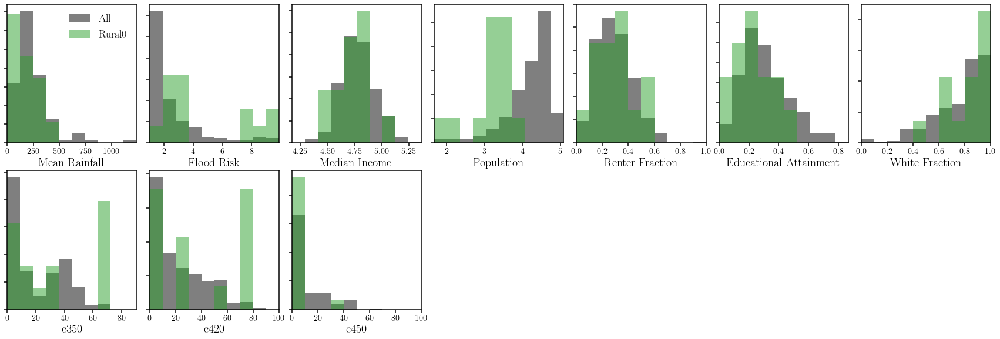

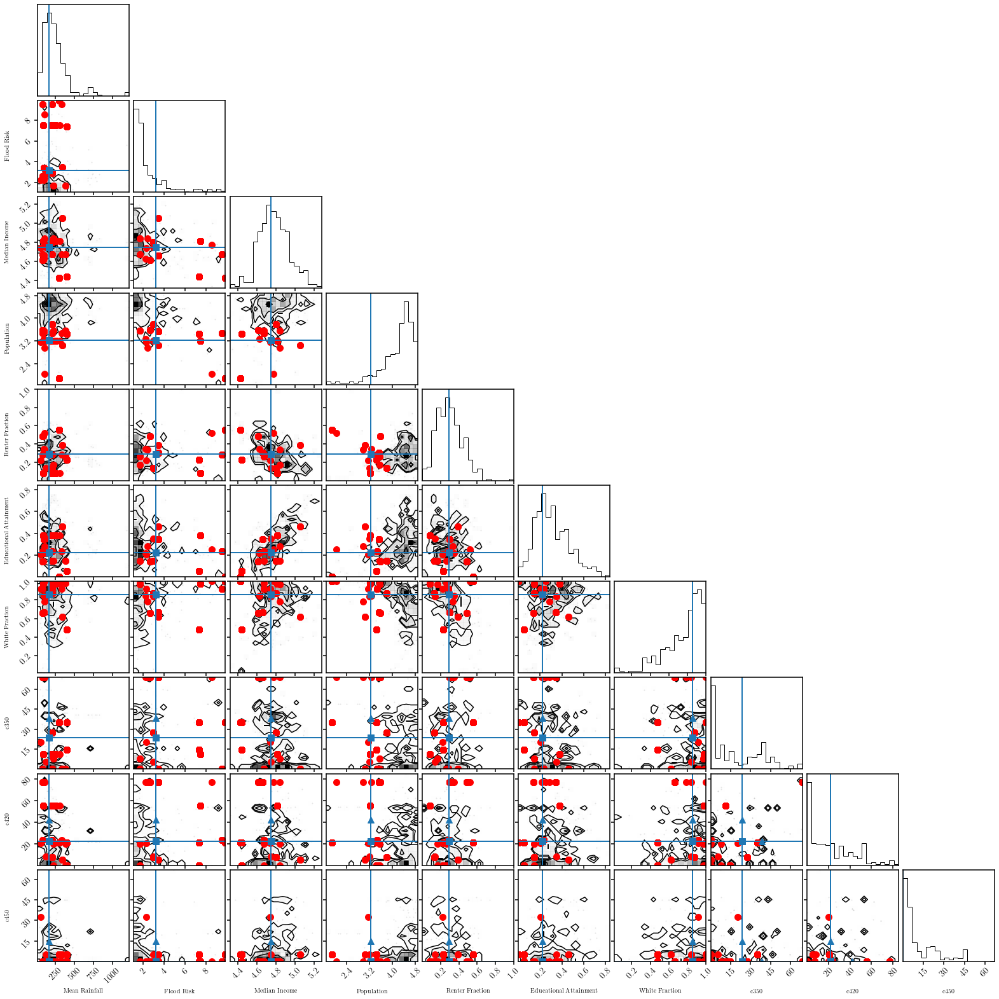

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


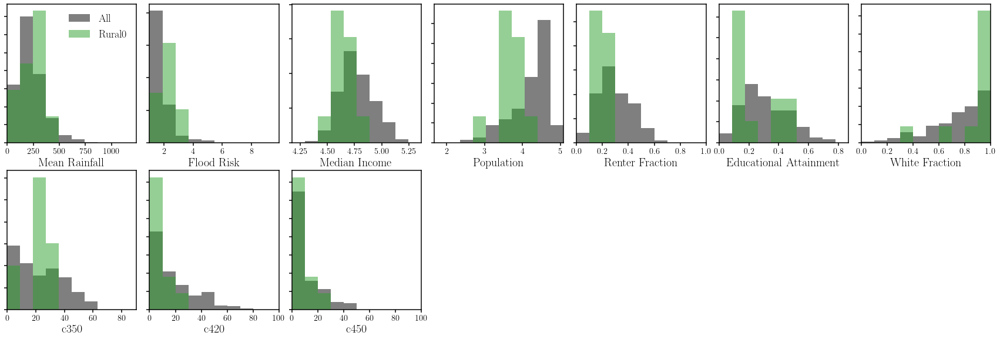

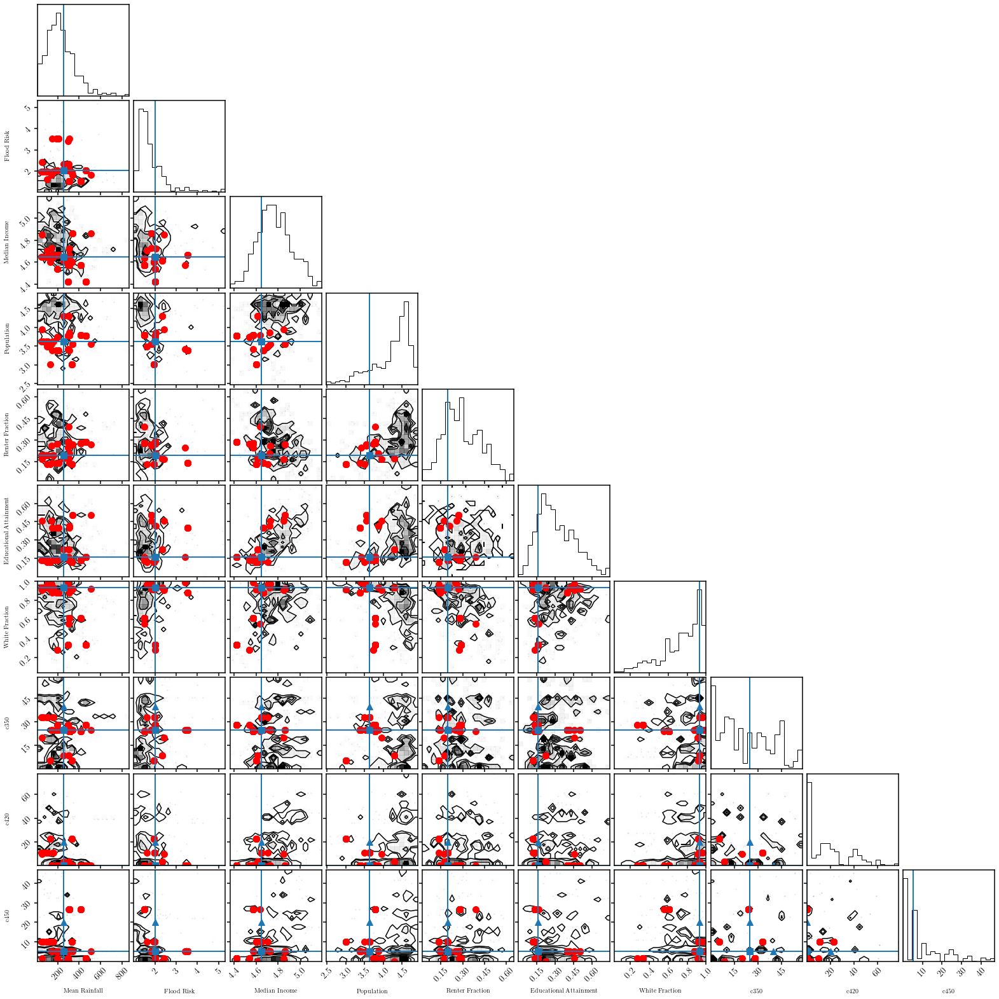

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


In [17]:
rural_fids, rural_dfids = [], []
for code in rural_codes: 
    _rural = rural & (binary_act_codes == code)
    _fid, _dfid = examine_archetype(code, _rural, 
                                    support_threshold=0.9, 
                                    dfids=[0, 0, 0, 0, 0, 0, 0, 15., 20., 15.], 
                                    verbose=False)
    
    rural_fids.append(_fid)
    rural_dfids.append(_dfid)

# small towns

In [18]:
codes, counts = np.unique(binary_act_codes[small], return_counts=True)

small_codes = []
for code, count in zip(codes[np.argsort(counts)[::-1]], counts[np.argsort(counts)[::-1]]):
    _nzip = len(np.unique(fema['zipcode'][small & (binary_act_codes == code)]))
    
    if count < 50 or _nzip < 5 or code not in act_enough_stat: continue
    print(uncode(code), code, count, _nzip, np.sum(binary_act_codes == code))
    small_codes.append(code)

[0 1 0 0 0 0 0] 2.0 293 6 3861
[0 0 0 0 0 0 0] 0.0 182 17 12737
[0 0 0 0 0 0 1] 64.0 118 11 4971


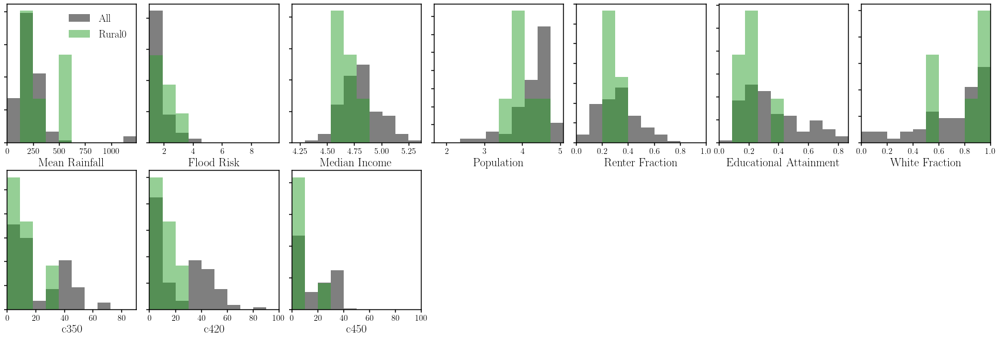

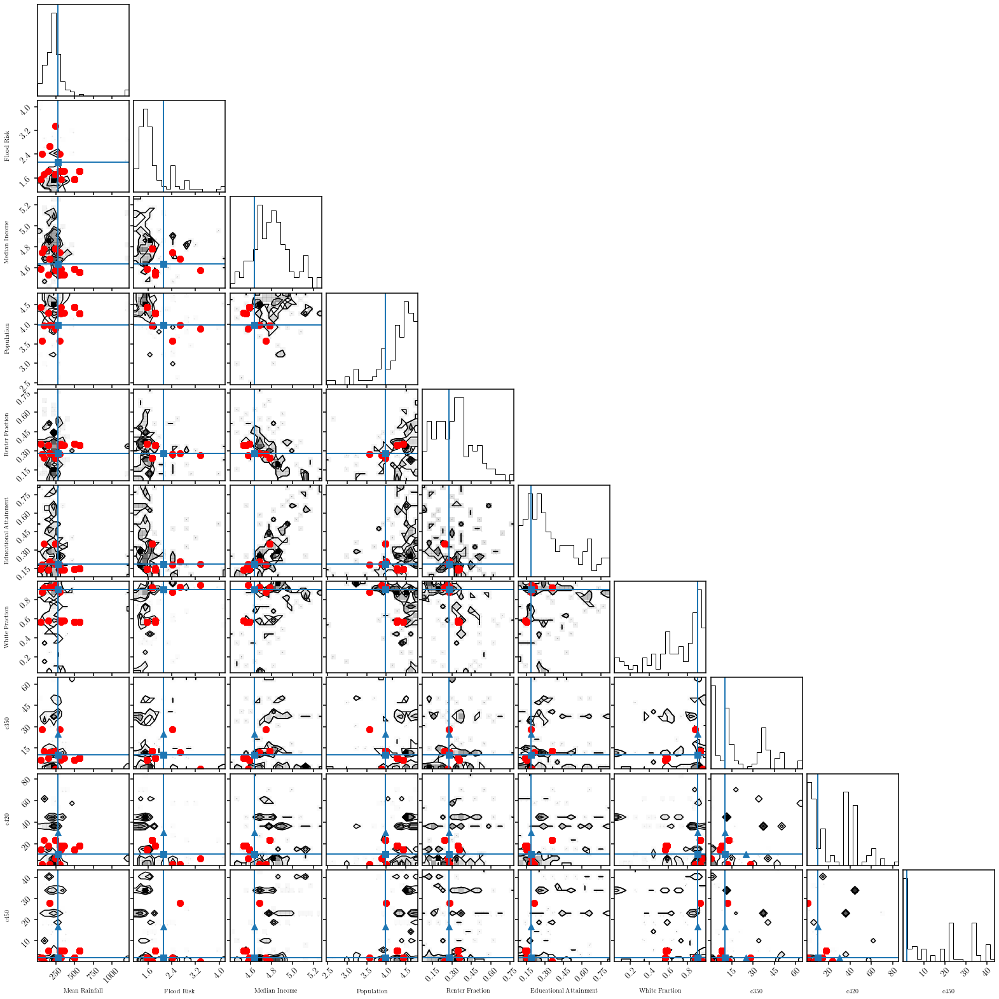

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


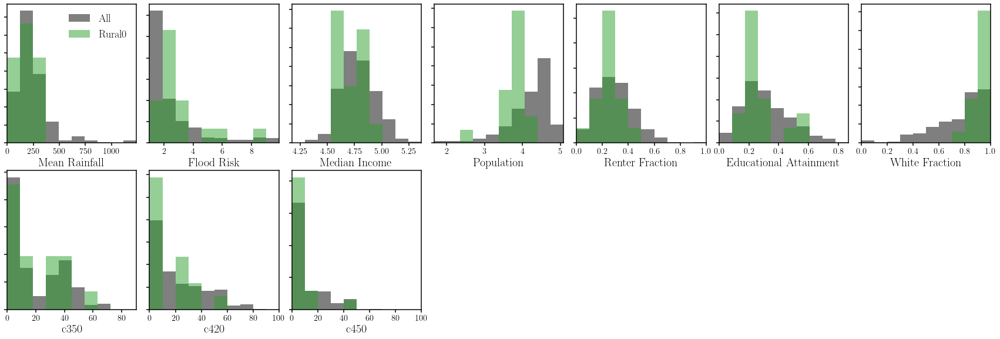

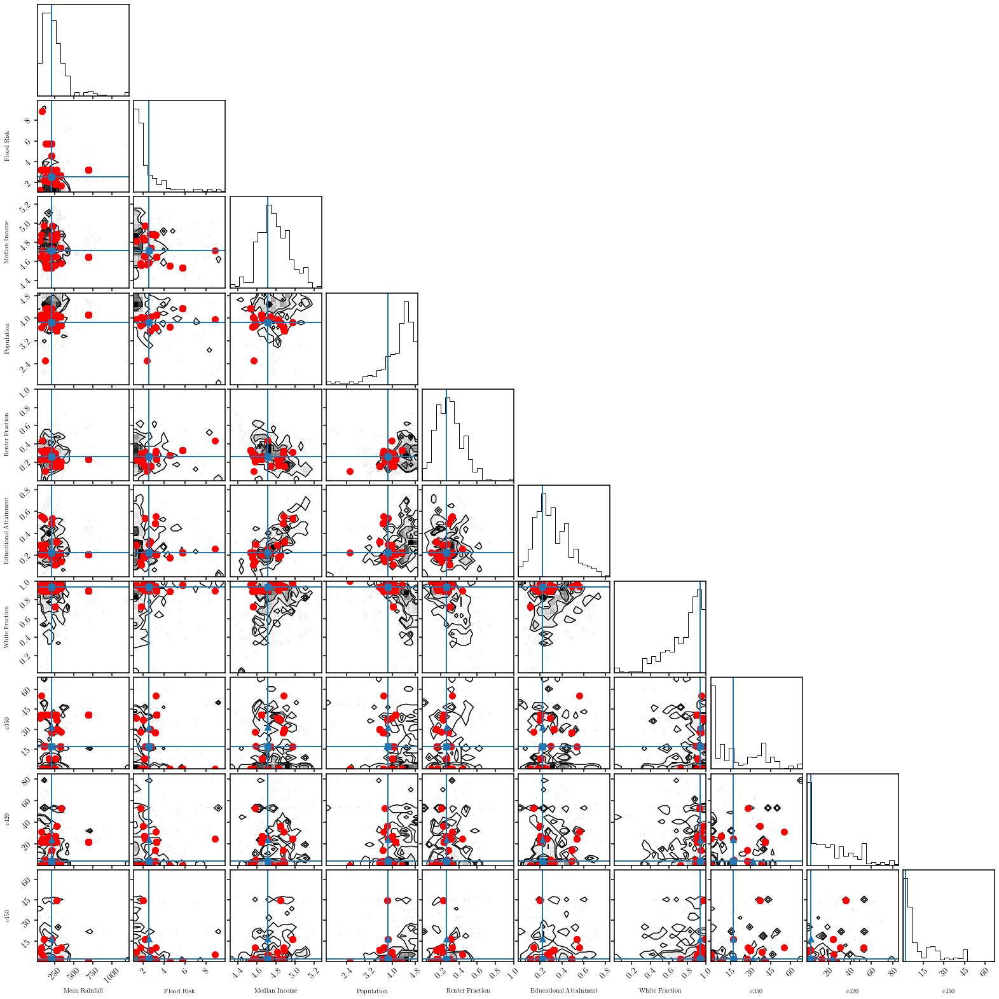

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


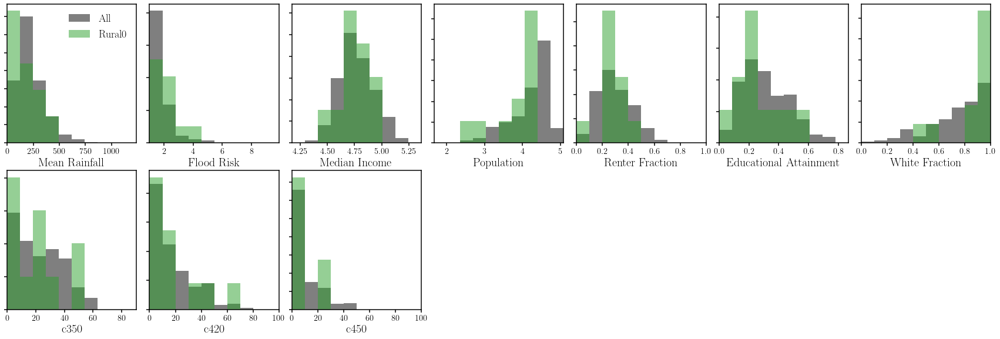

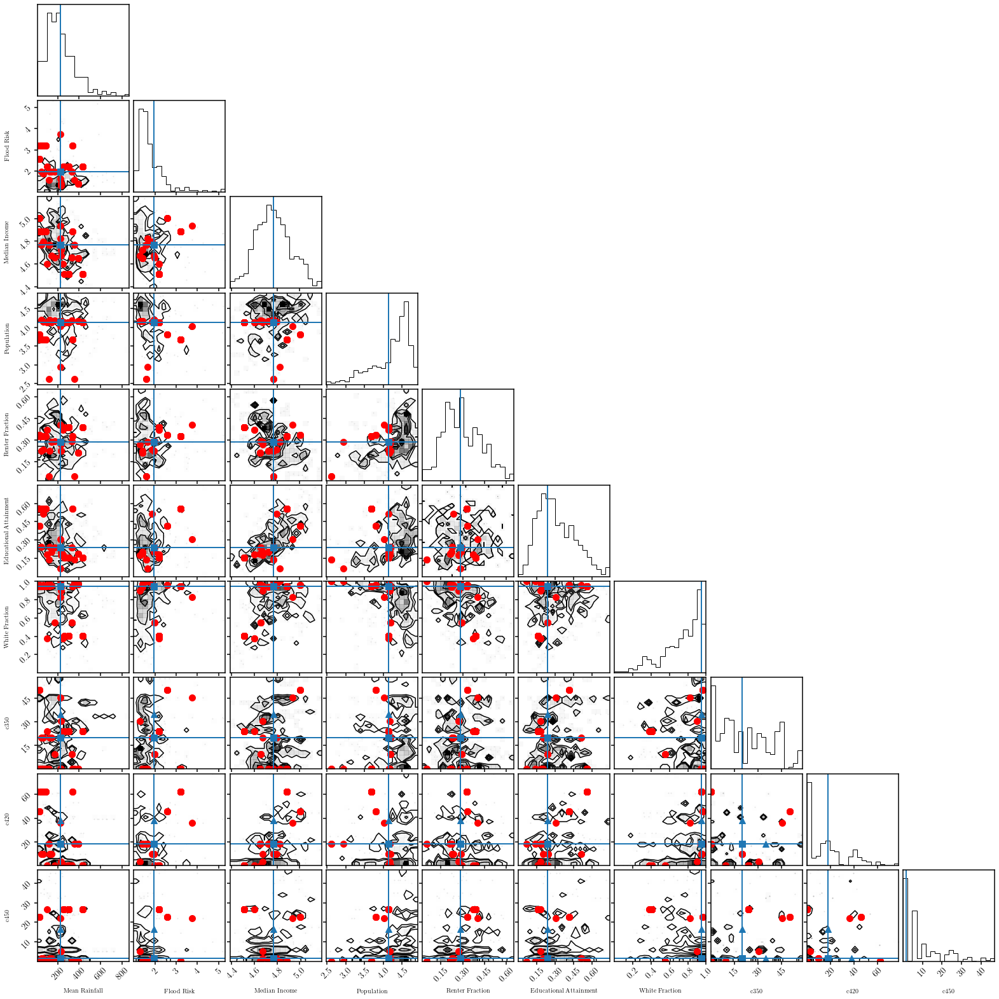

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


In [19]:
small_fids, small_dfids = [], []
for code in small_codes: 
    _small = small & (binary_act_codes == code)
    _fid, _dfid = examine_archetype(code, _small, 
                                    support_threshold=0.9, 
                                    dfids=[0, 0, 0, 0, 0, 0, 0, 15., 20., 15.], 
                                    verbose=False)
    
    small_fids.append(_fid)
    small_dfids.append(_dfid)

# Micropolitan communities

In [20]:
codes, counts = np.unique(binary_act_codes[micro], return_counts=True)

micro_codes = []
for code, count in zip(codes[np.argsort(counts)[::-1]], counts[np.argsort(counts)[::-1]]):
    _nzip = len(np.unique(fema['zipcode'][micro & (binary_act_codes == code)]))
    
    if count < 50 or _nzip < 5 or code not in act_enough_stat: continue
    print(uncode(code), code, count, _nzip, np.sum(binary_act_codes == code))
    micro_codes.append(code)

[0 0 0 0 0 0 0] 0.0 3809 39 12737
[0 0 0 1 0 0 0] 8.0 582 13 4399
[0 1 0 0 0 0 0] 2.0 568 12 3861
[0 0 0 0 0 0 1] 64.0 498 30 4971
[1 0 0 1 0 0 0] 9.0 335 7 1935
[0 1 0 0 0 0 1] 66.0 284 7 2109
[1 1 0 1 0 0 1] 75.0 89 5 30175


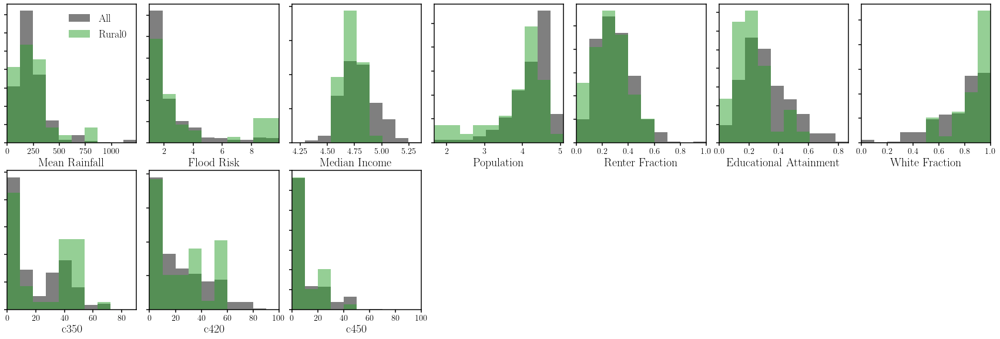

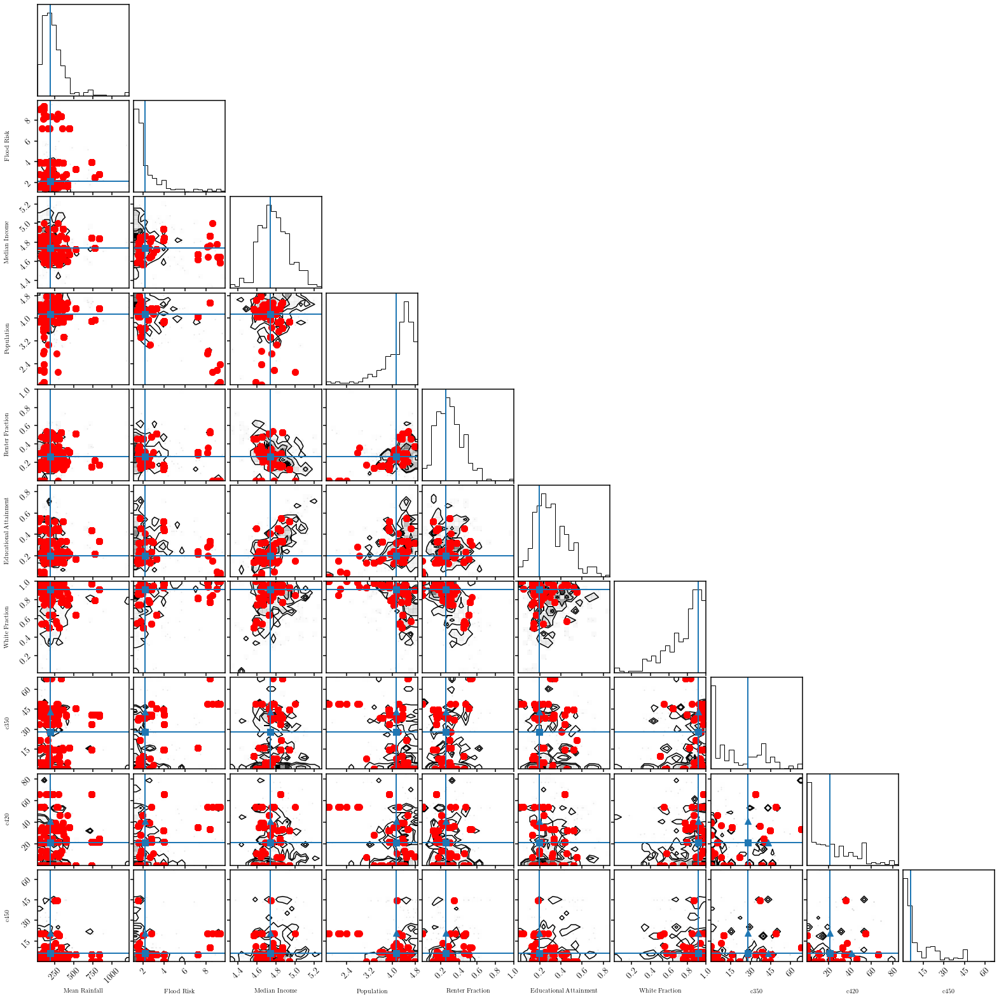

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


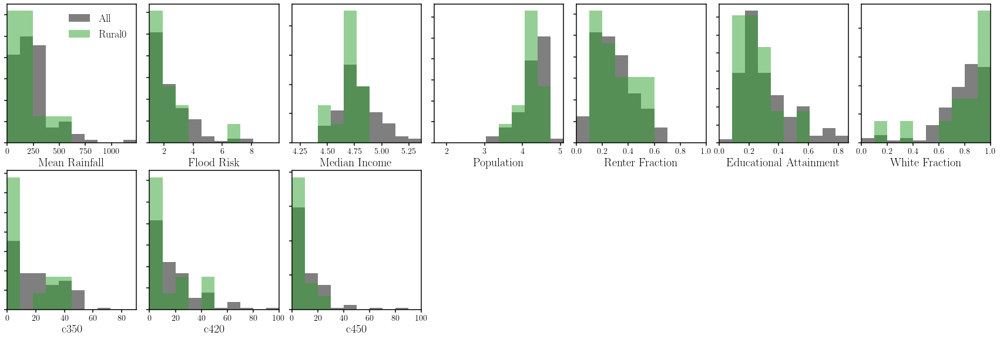

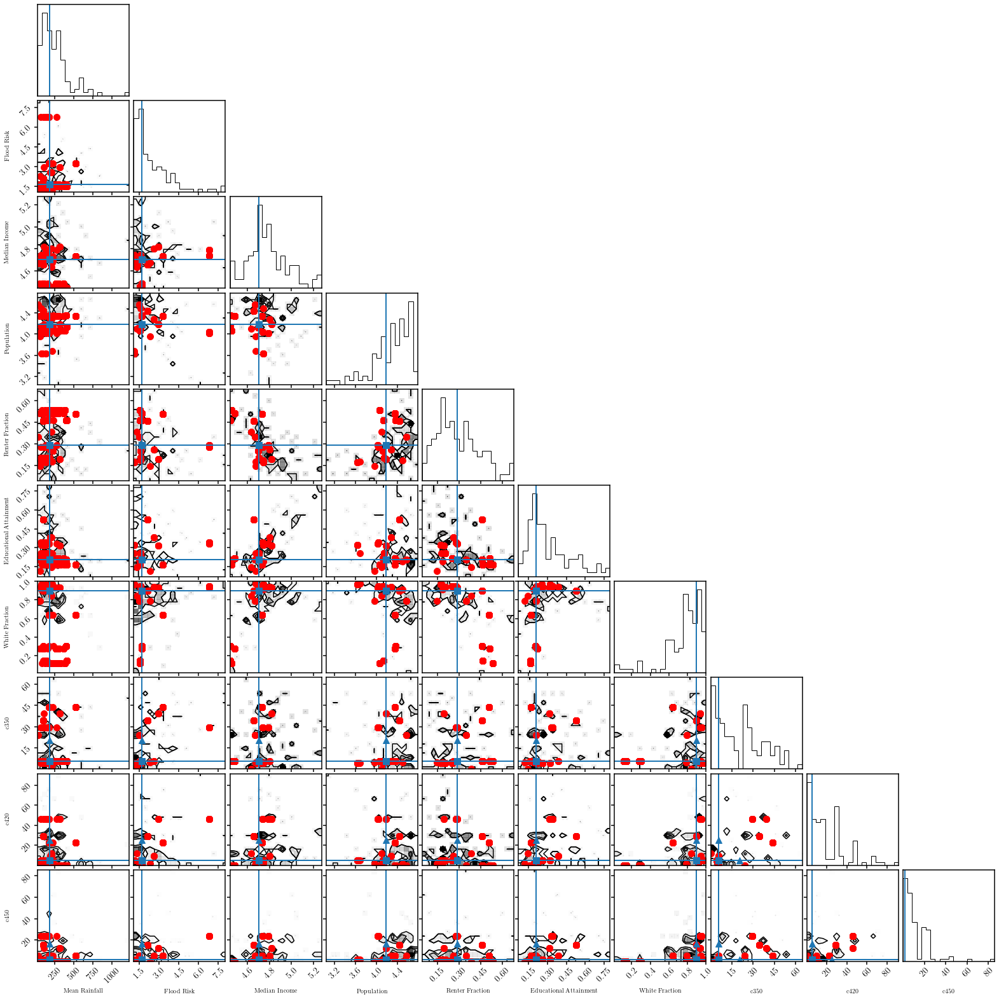

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


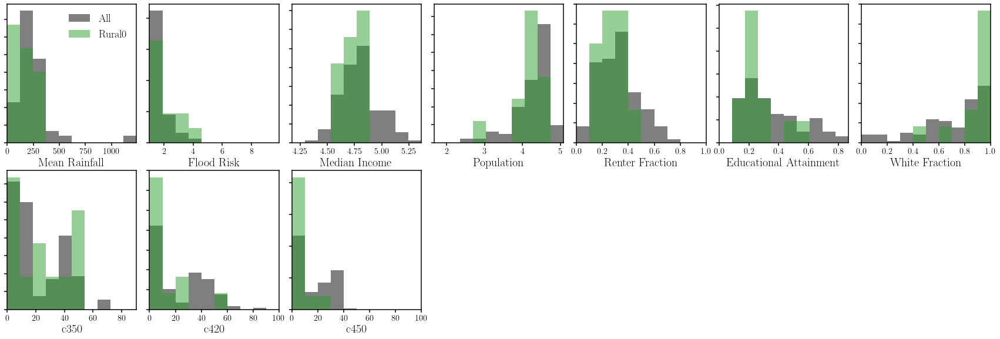

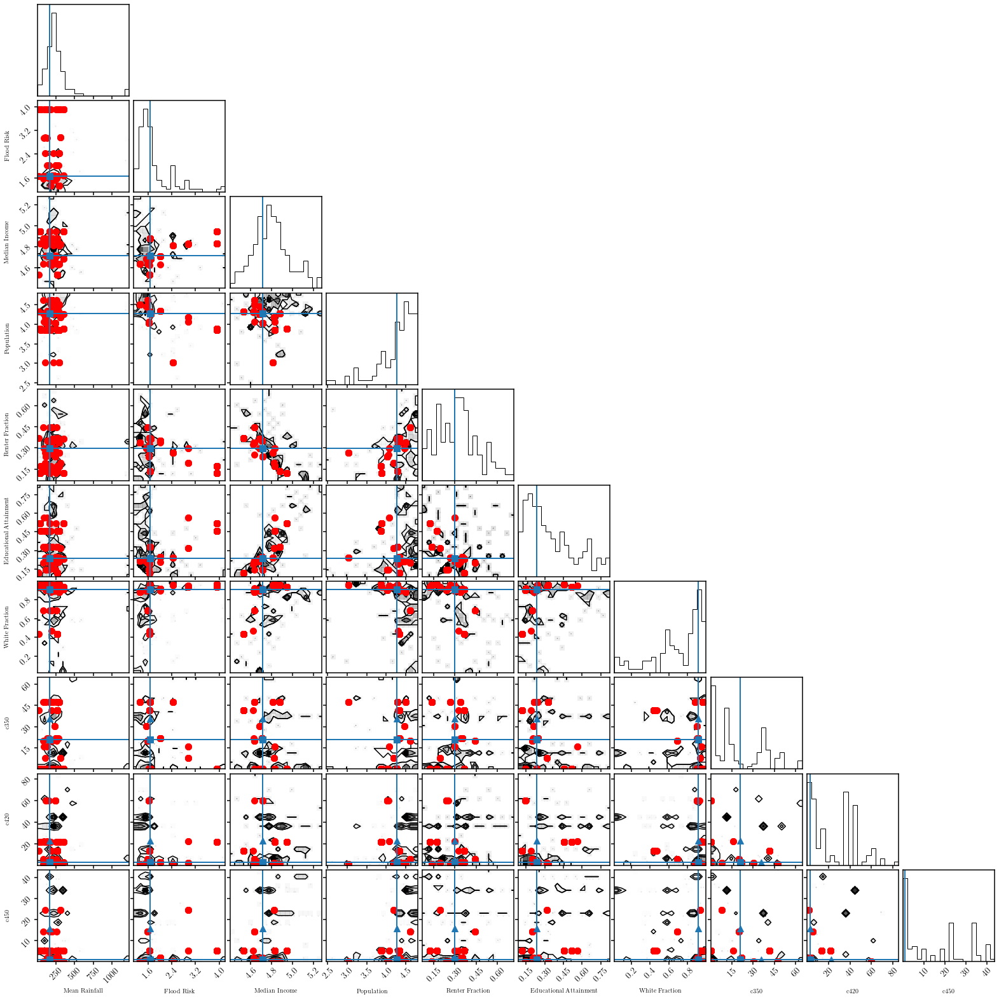

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


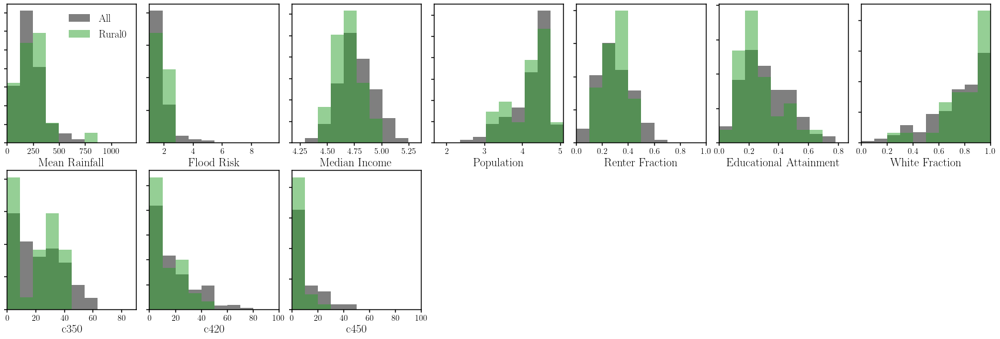

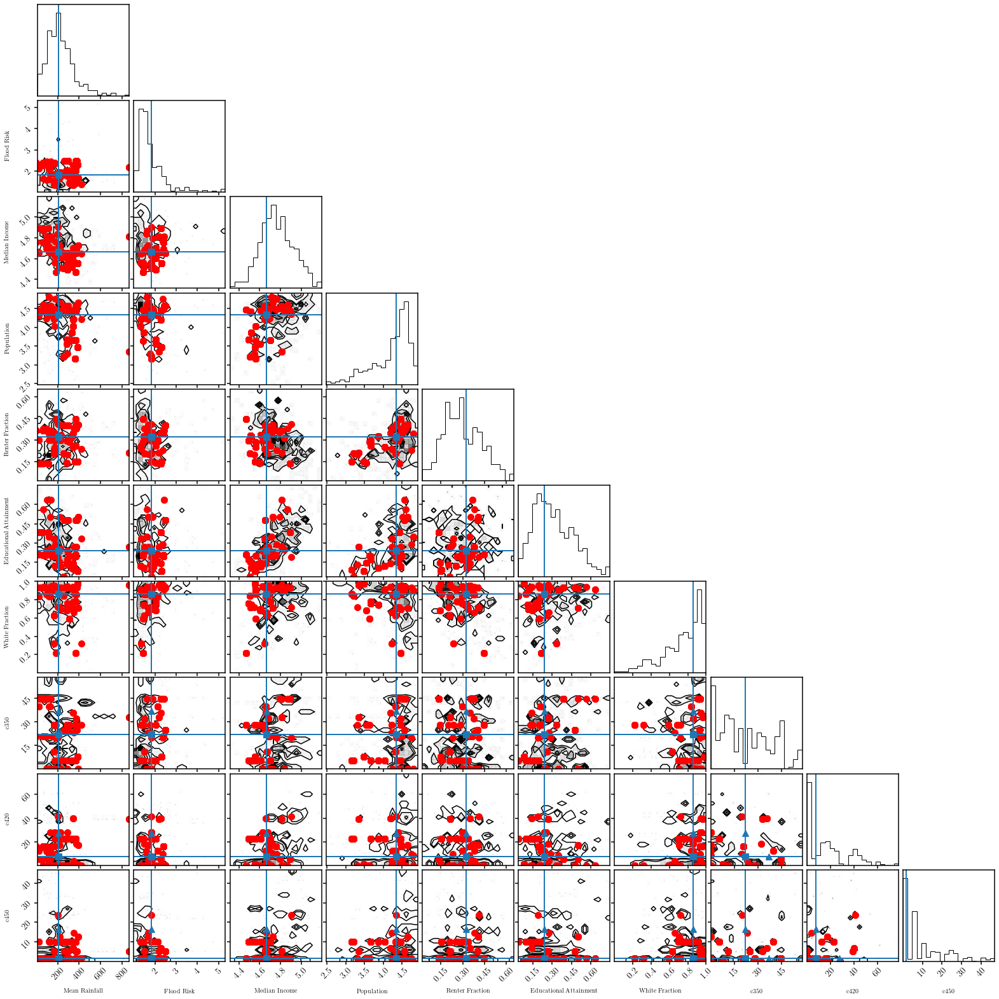

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


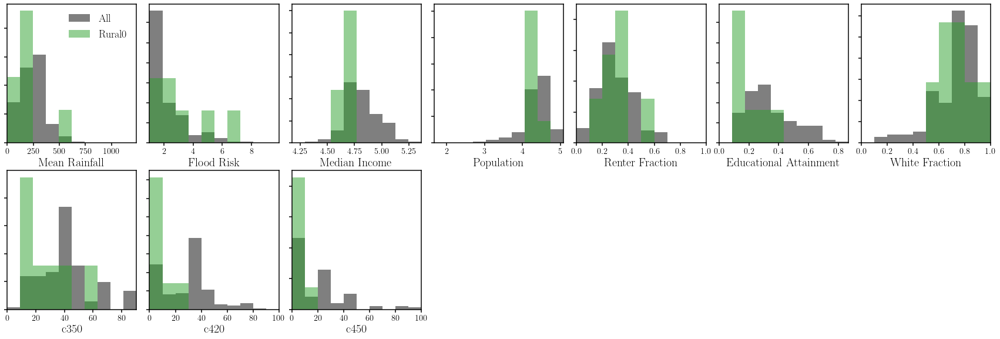

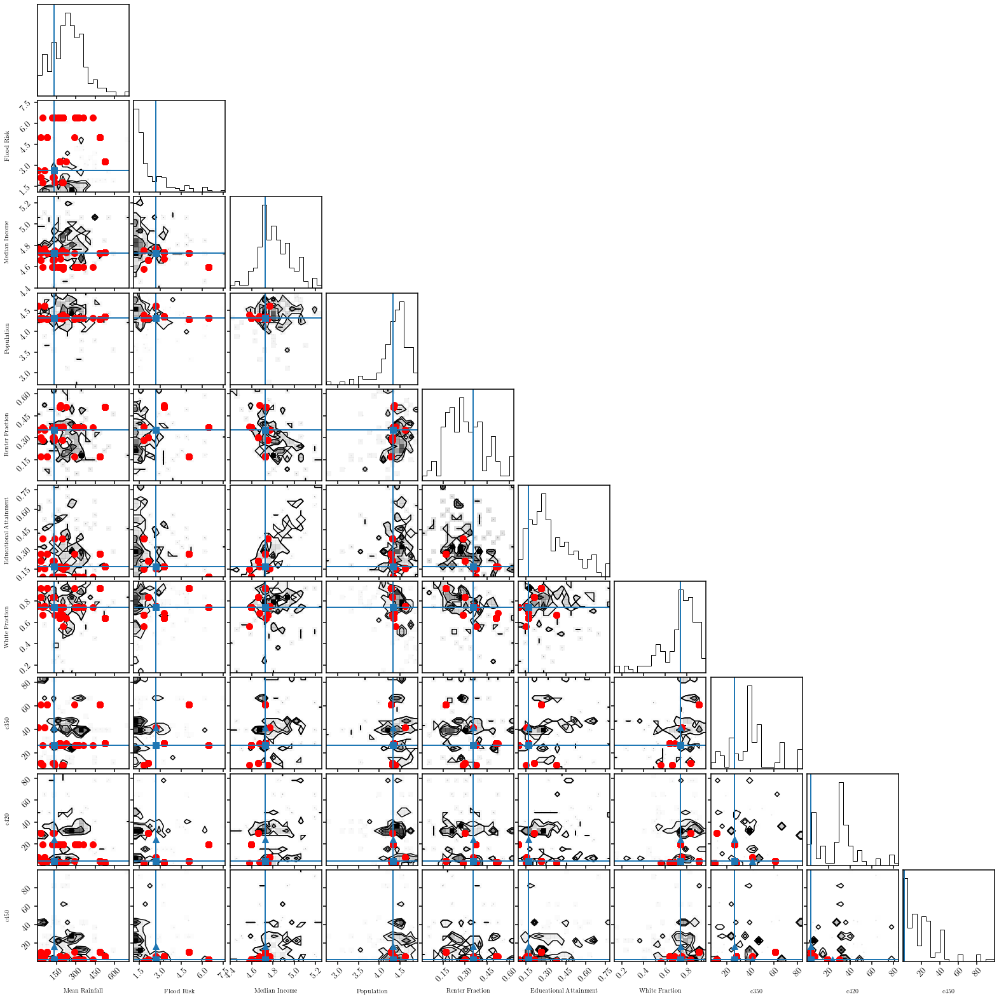

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


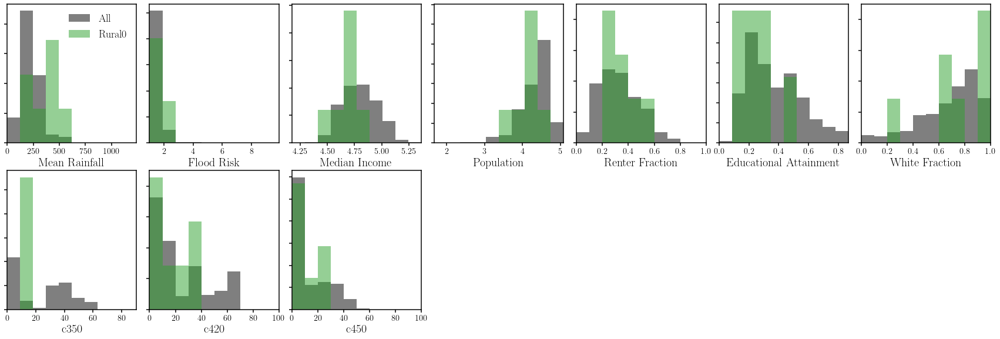

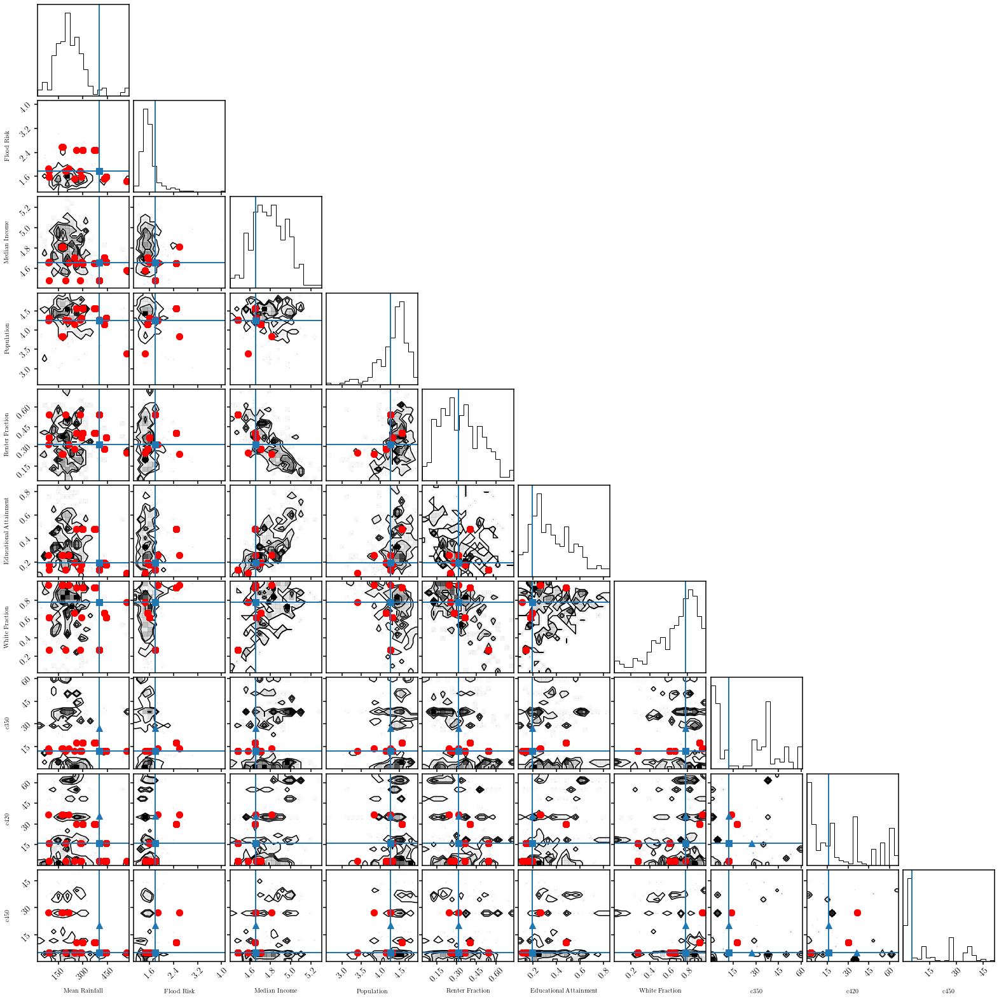

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


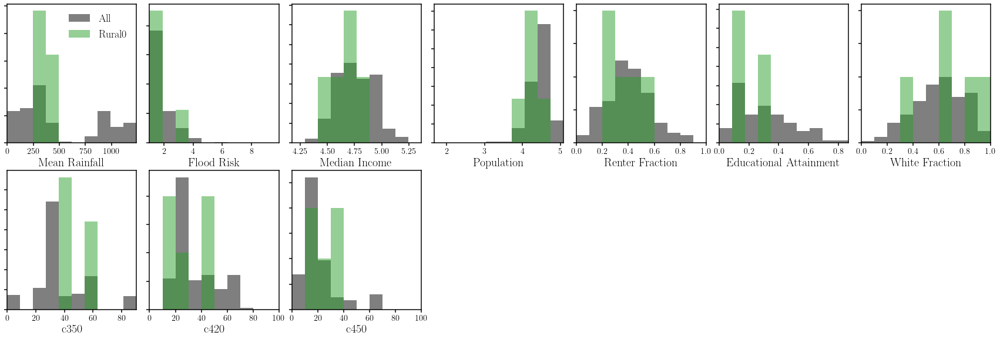

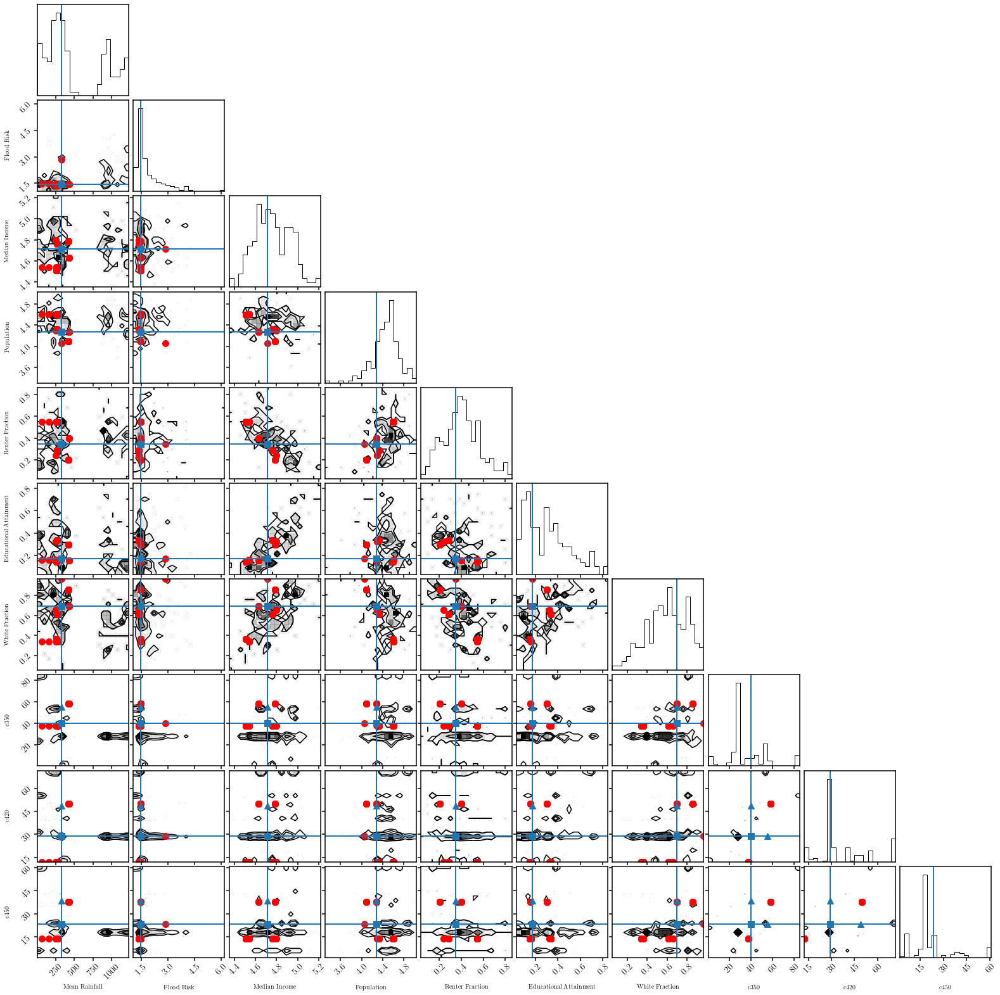

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


In [21]:
micro_fids, micro_dfids = [], []
for code in micro_codes: 
    _micro = micro & (binary_act_codes == code)
    _fid, _dfid = examine_archetype(code, _micro,
                                    support_threshold=0.9, 
                                    dfids=[0, 0, 0, 0, 0, 0, 0, 15., 20., 15.], 
                                    verbose=False)
    
    micro_fids.append(_fid)
    micro_dfids.append(_dfid)    

# Metropolitan communities

In [22]:
codes, counts = np.unique(binary_act_codes[metro], return_counts=True)

metro_codes = []
for code, count in zip(codes[np.argsort(counts)[::-1]], counts[np.argsort(counts)[::-1]]):
    _nzip = len(np.unique(fema['zipcode'][metro & (binary_act_codes == code)]))
    
    if count < 50 or _nzip < 5 or code not in act_enough_stat: continue
    print(uncode(code), code, count, _nzip, np.sum(binary_act_codes == code))
    metro_codes.append(code)

[0 1 0 1 0 0 0] 10.0 52139 117 52339
[1 1 0 1 0 0 1] 75.0 30083 158 30175
[0 0 0 0 0 0 0] 0.0 6566 215 12737
[0 0 0 1 0 0 0] 8.0 2870 85 4399
[1 1 0 1 1 0 0] 27.0 2790 110 2798
[0 0 0 0 0 0 1] 64.0 2700 194 4971
[0 1 0 0 0 0 0] 2.0 2514 77 3861
[0 1 0 0 0 0 1] 66.0 1649 196 2109
[1 0 0 1 0 0 0] 9.0 1352 124 1935
[0 0 0 1 0 0 1] 72.0 830 109 1005


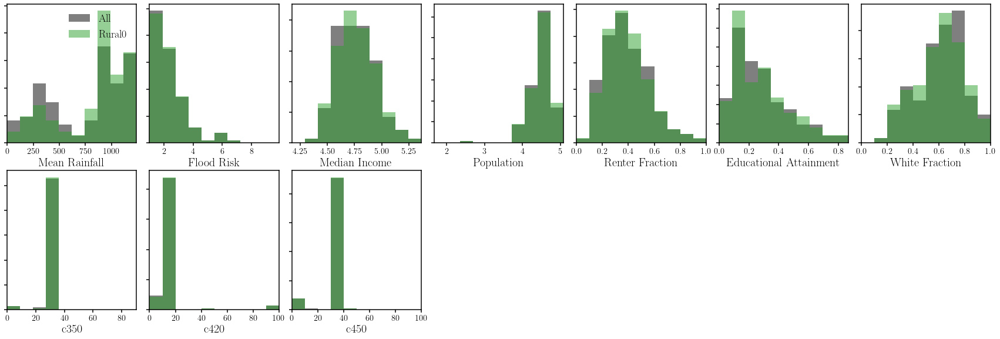

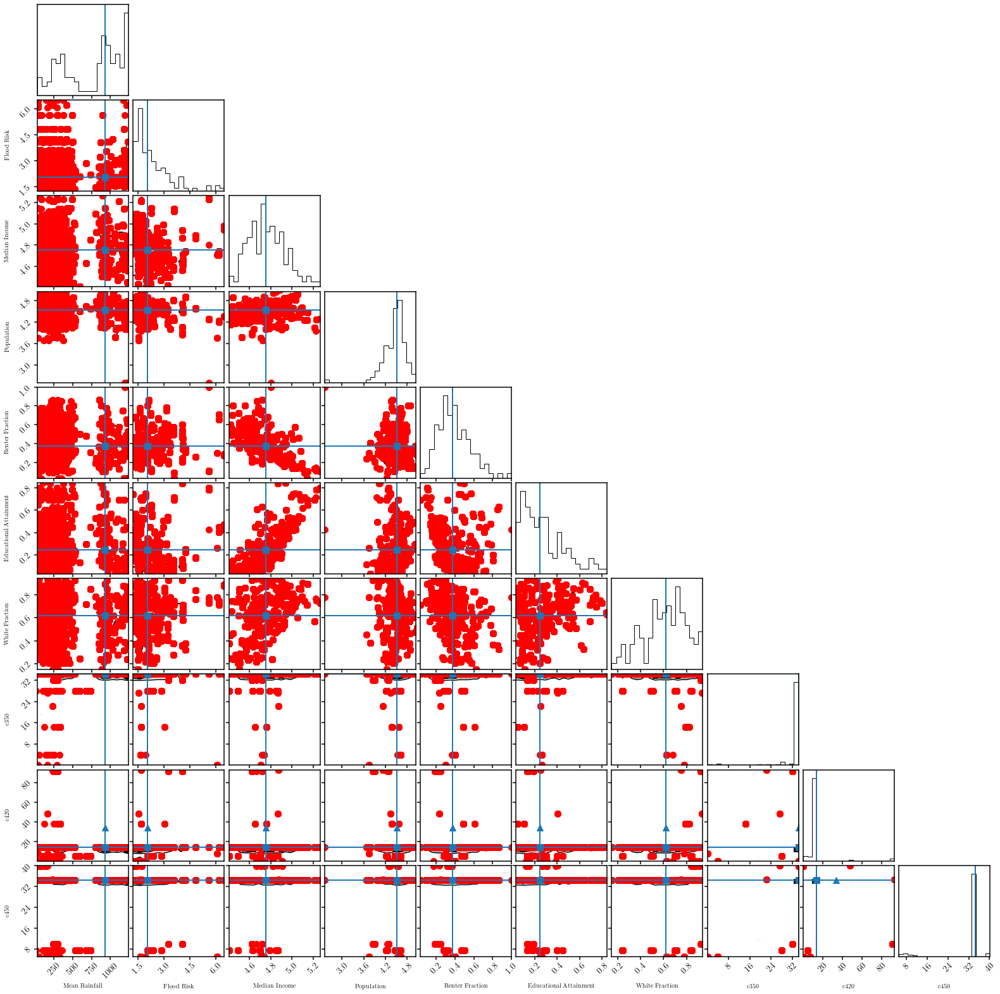

fiducial in support
fiducial + d c350 False
fiducial + d c420 False
fiducial + d c450 False


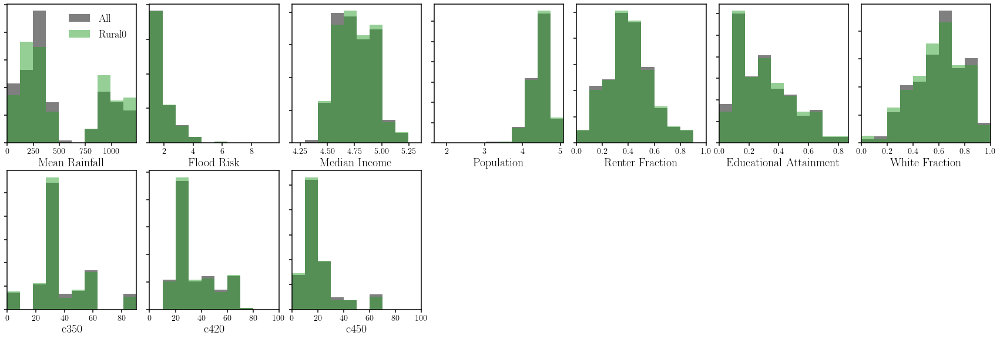

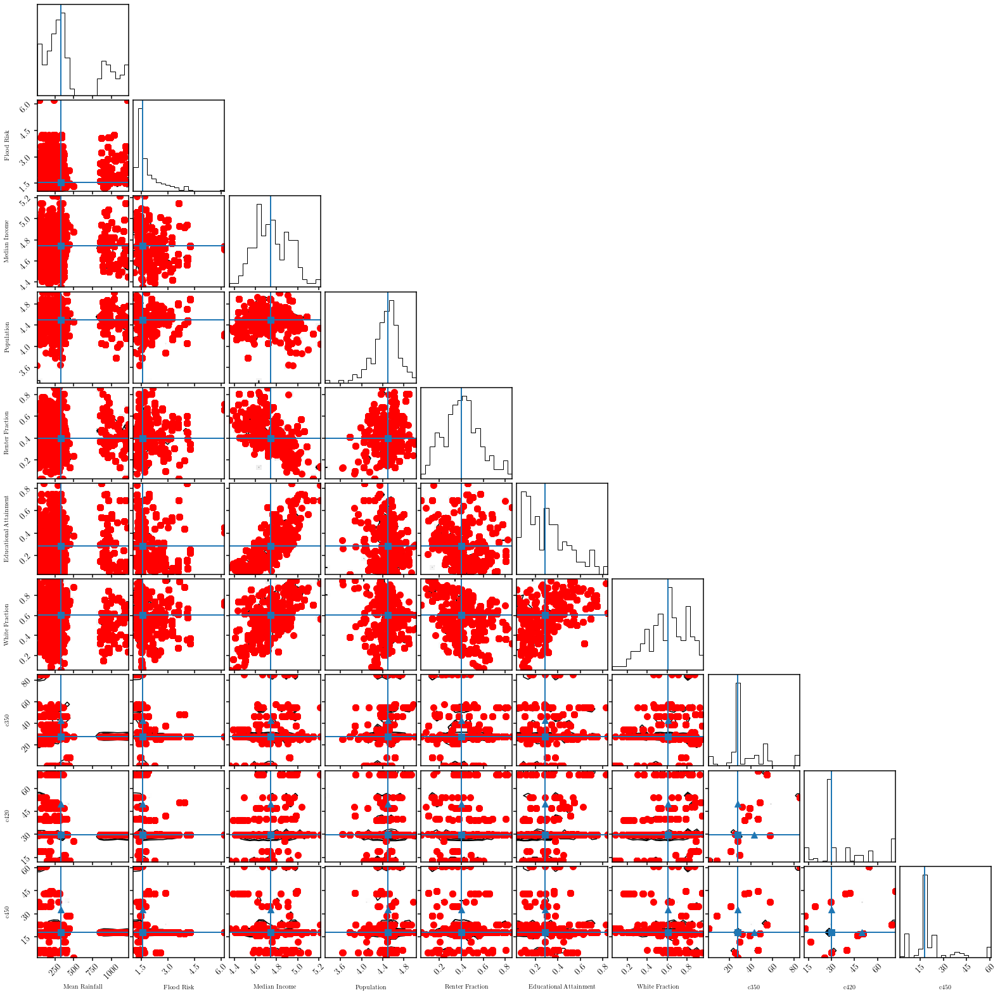

fiducial in support
fiducial + d c350 True
fiducial + d c420 False
fiducial + d c450 True


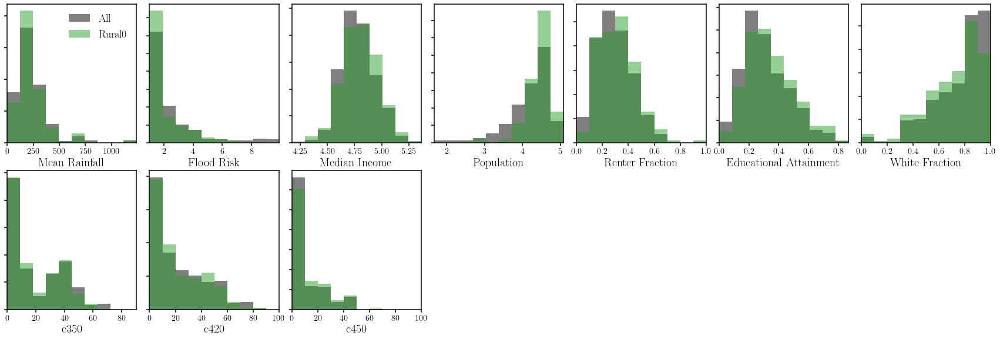

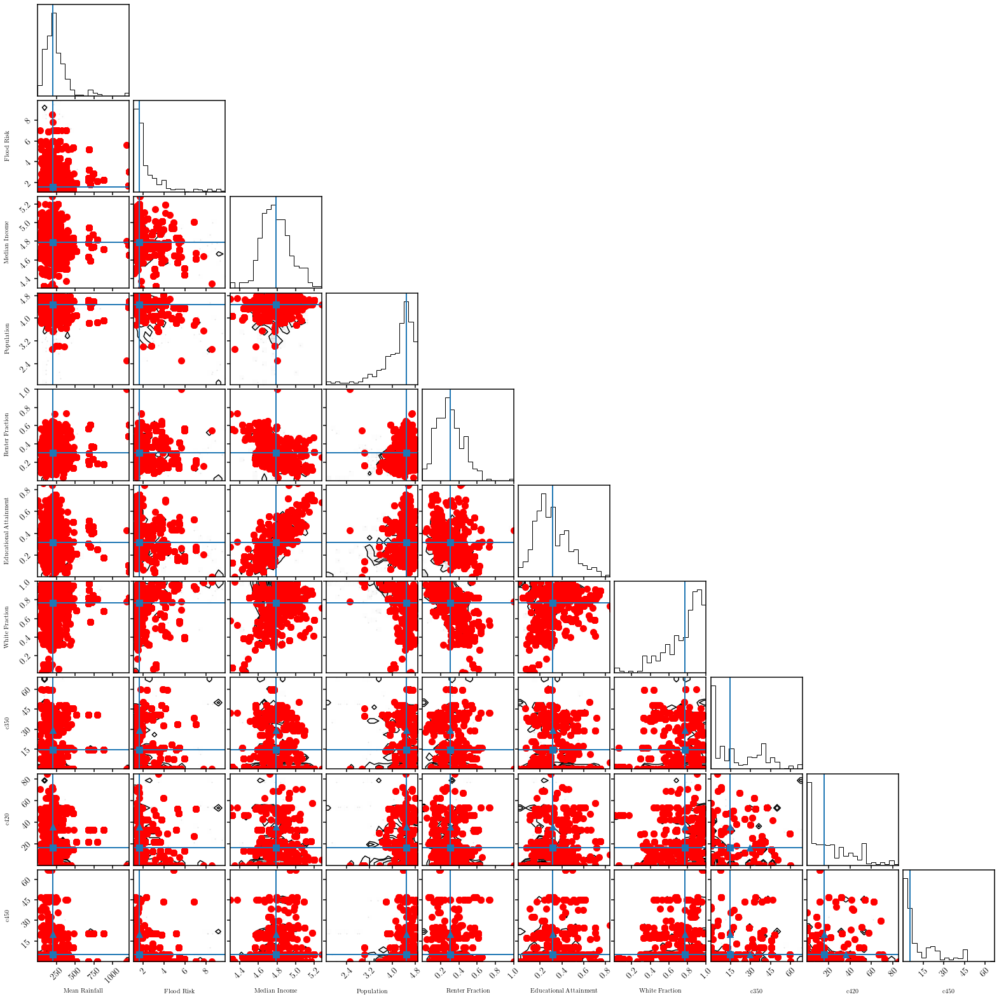

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


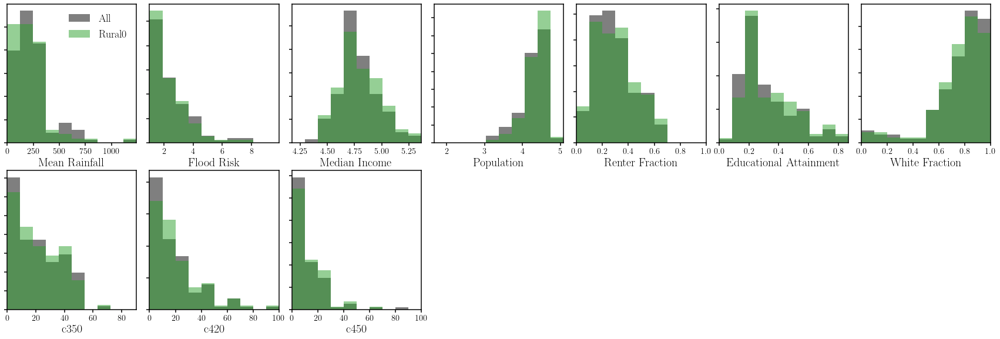

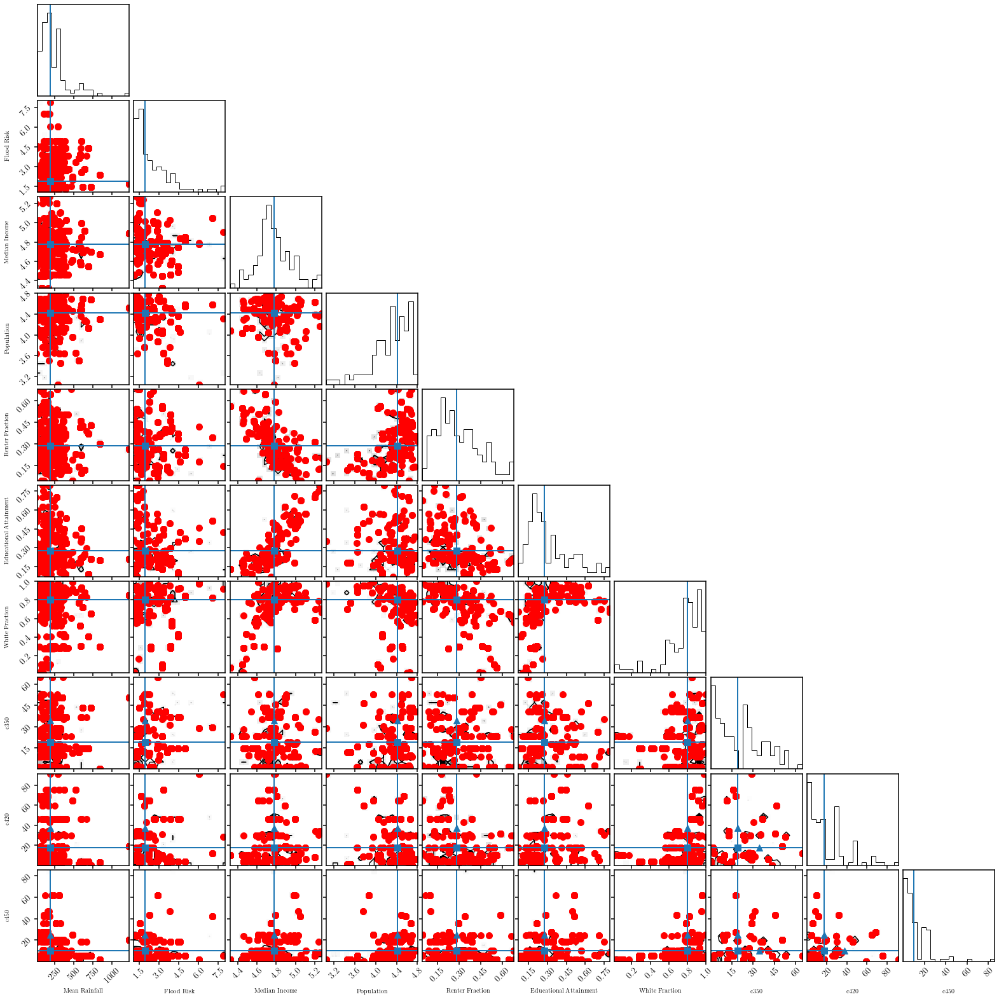

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


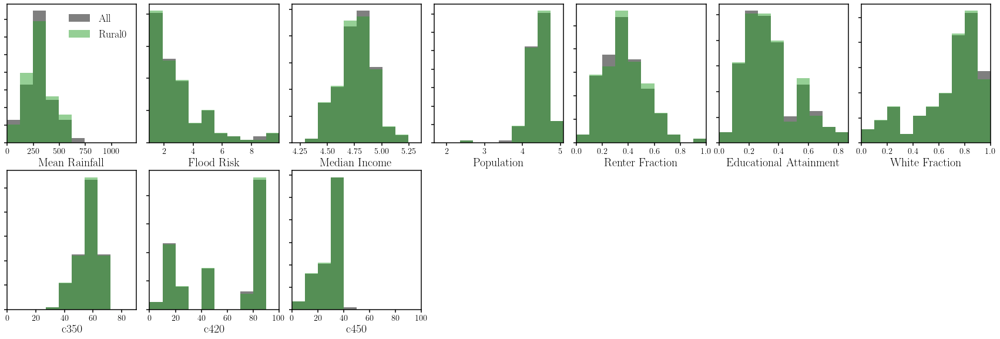

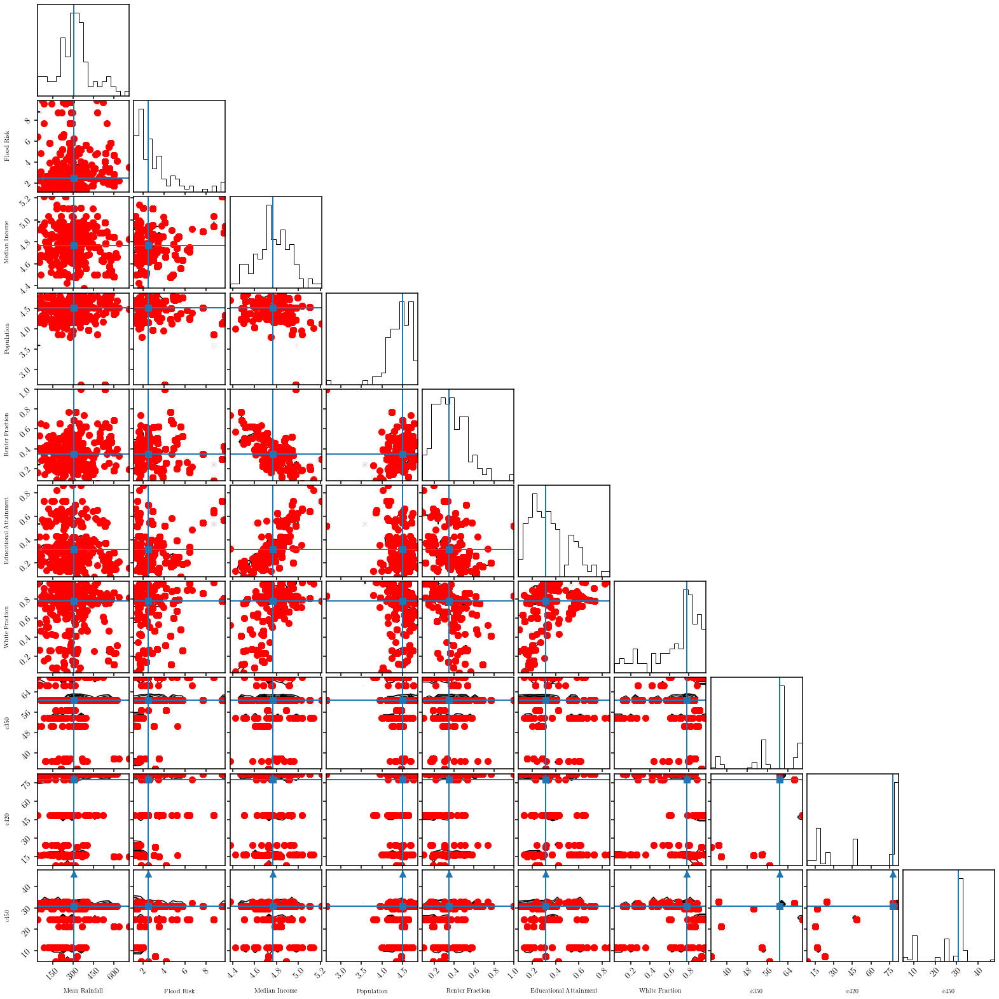

fiducial in support
fiducial + d c350 False
fiducial + d c420 False
fiducial + d c450 False


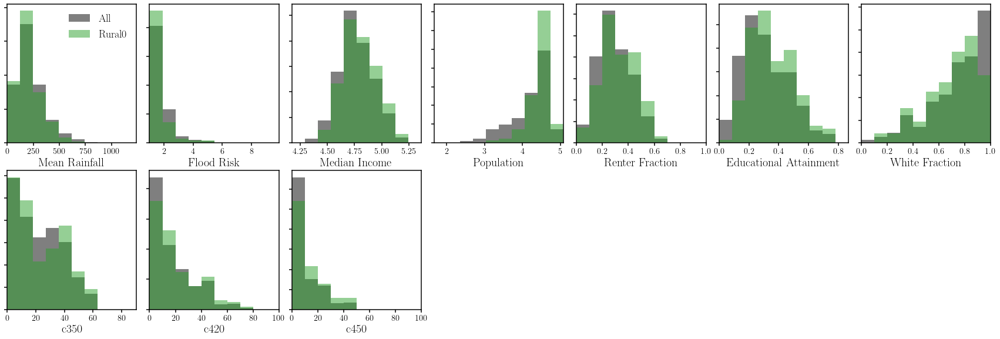

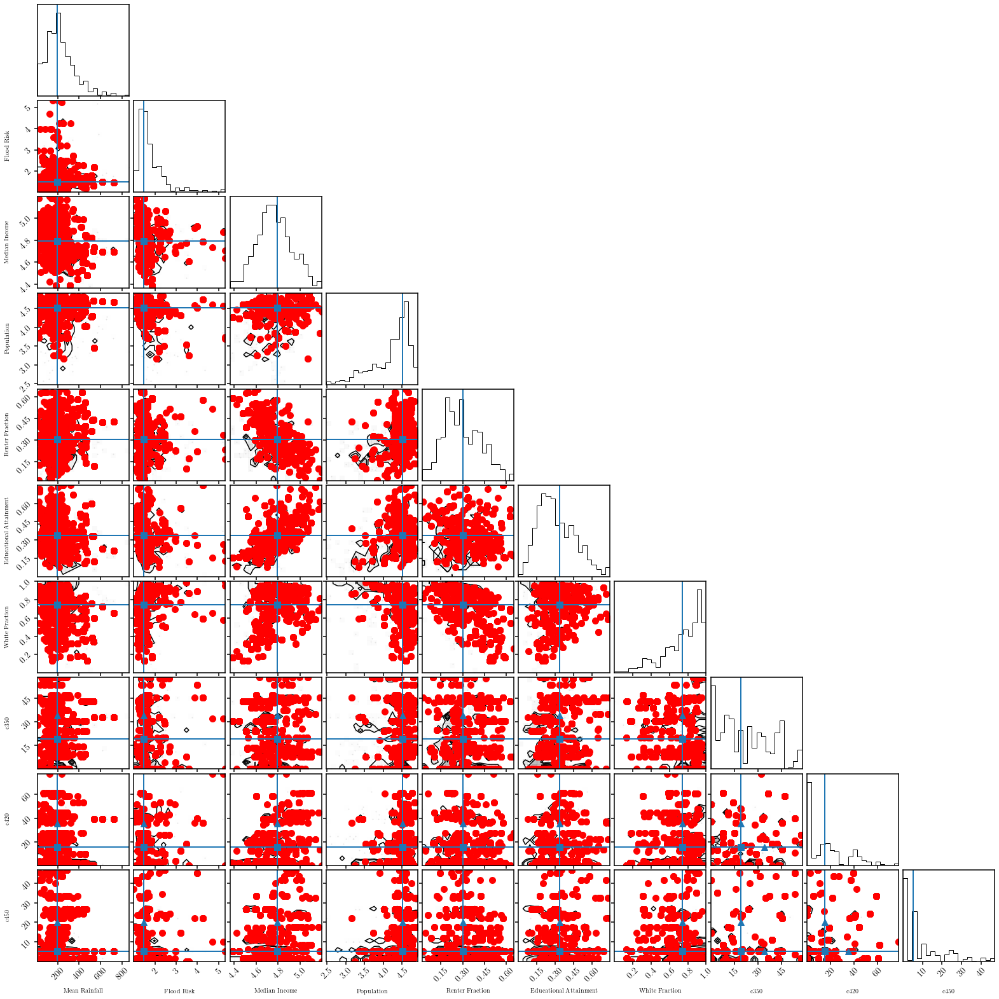

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


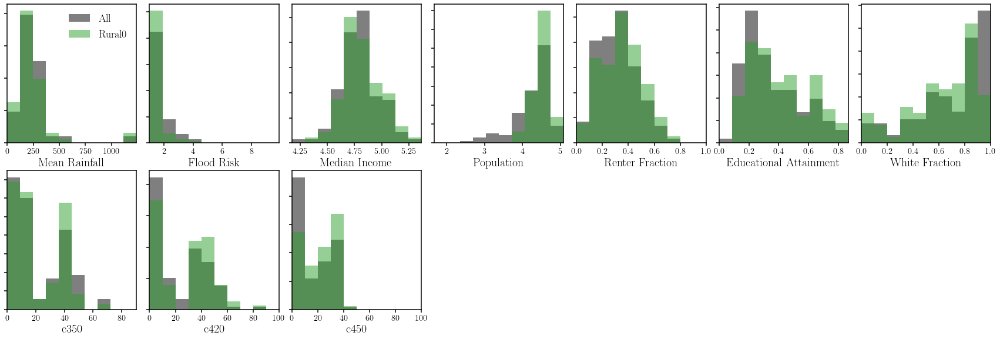

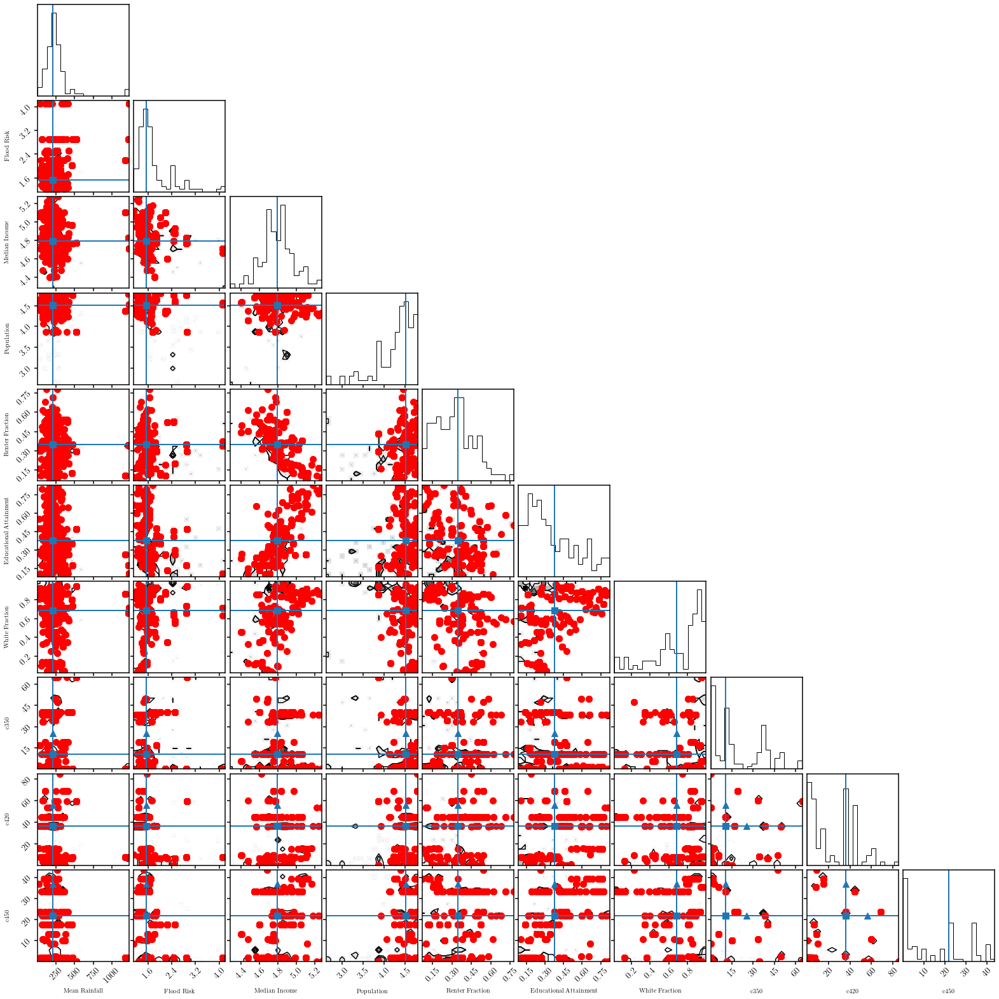

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


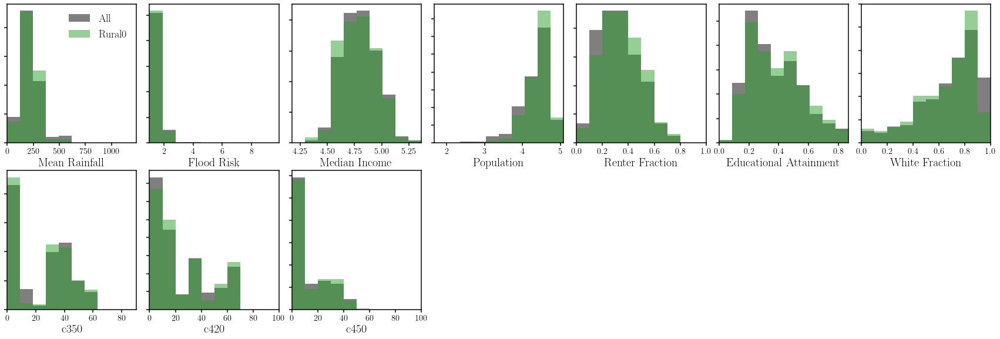

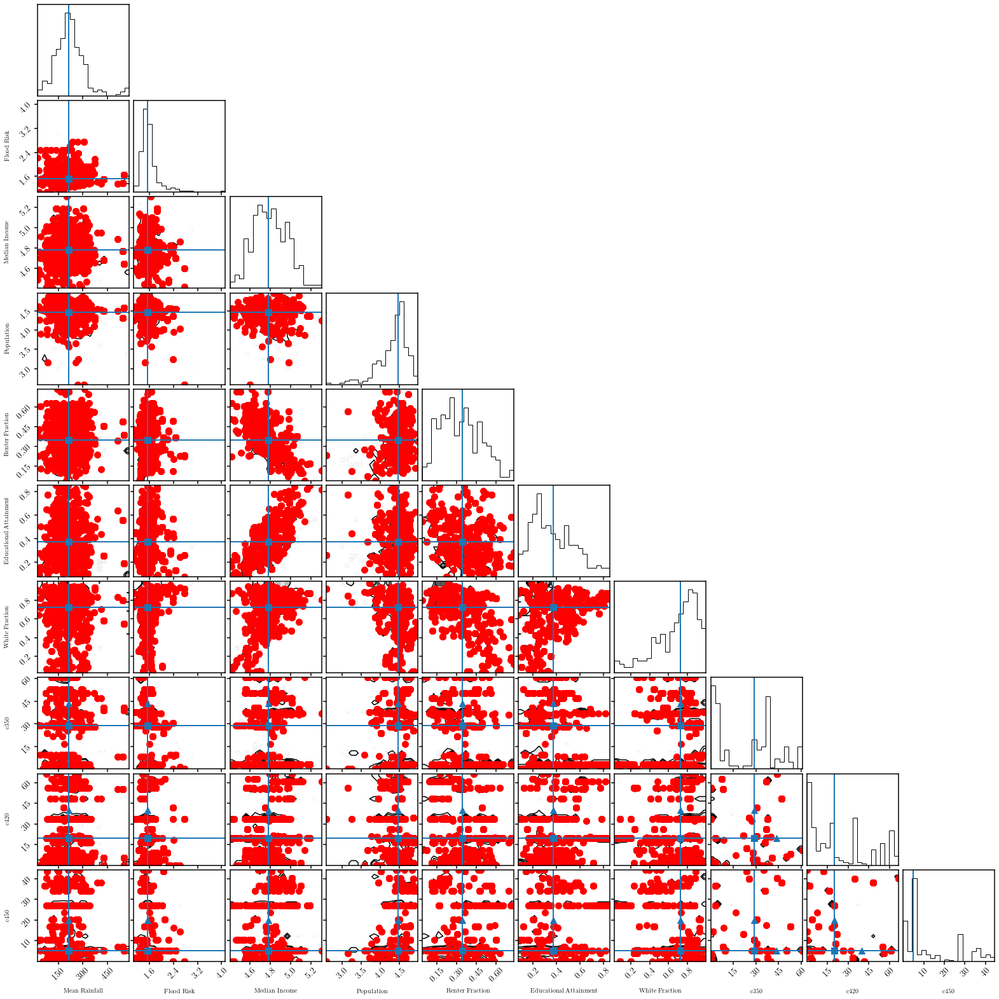

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


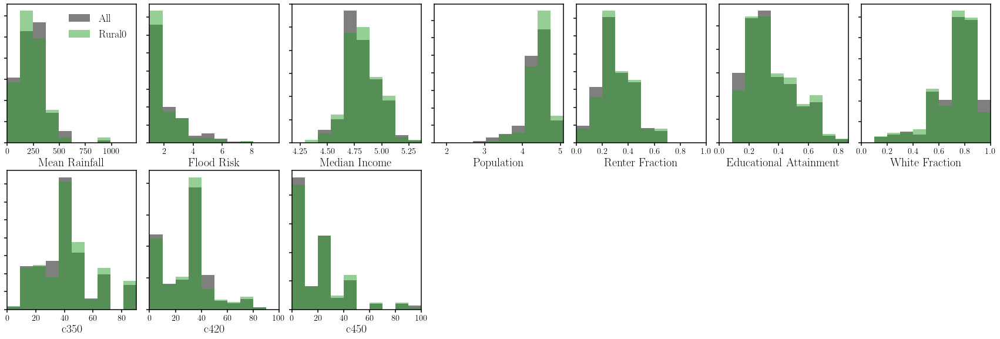

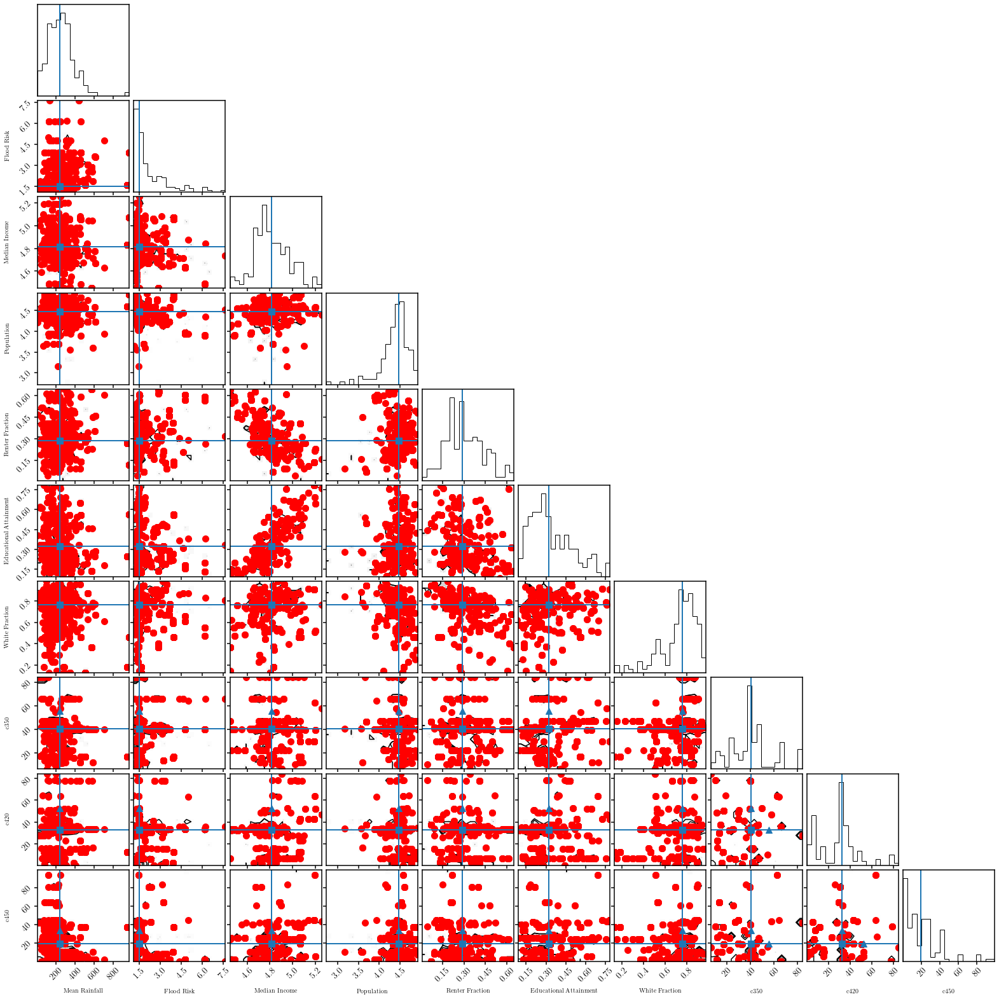

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


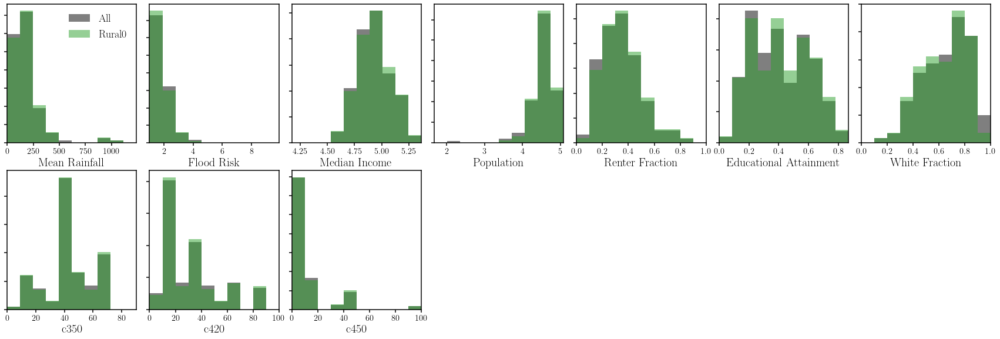

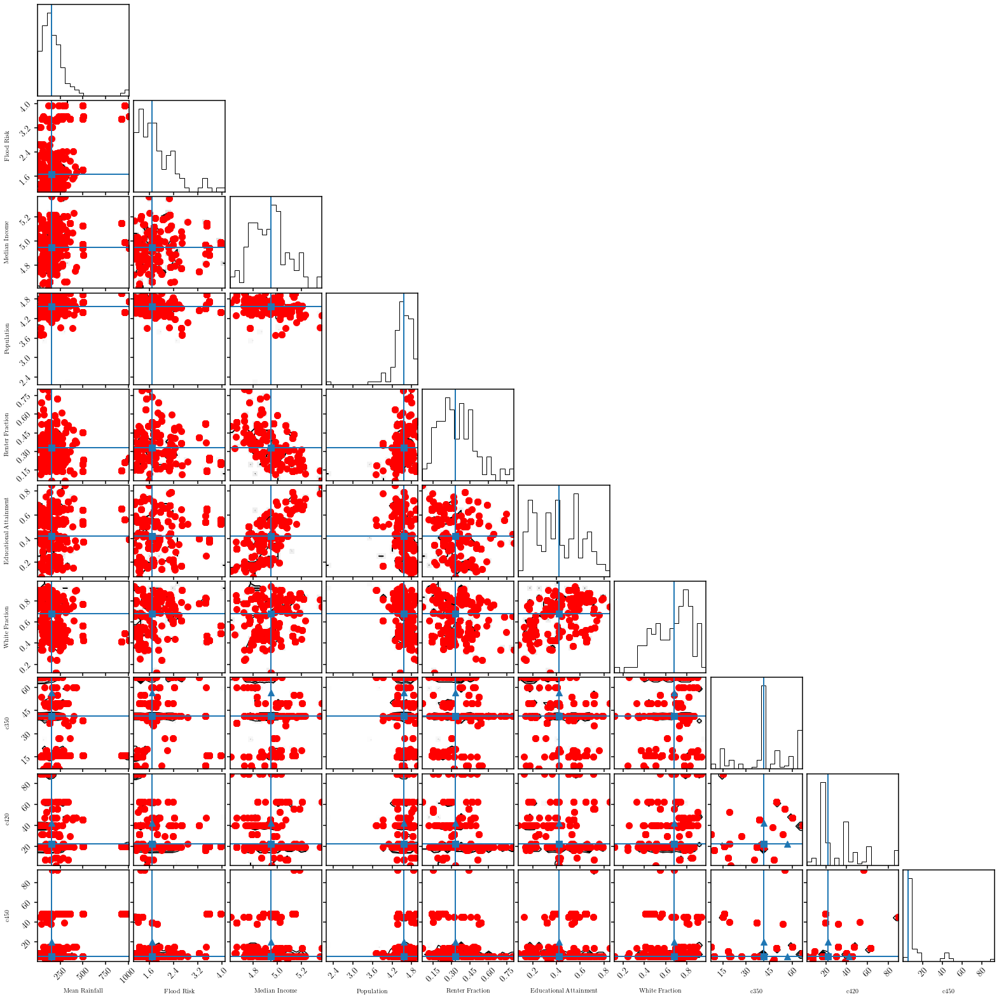

fiducial in support
fiducial + d c350 True
fiducial + d c420 True
fiducial + d c450 True


In [23]:
metro_fids, metro_dfids = [], []
for code in metro_codes: 
    _metro = metro & (binary_act_codes == code)
    _fid, _dfid = examine_archetype(code, _metro, 
                                    support_threshold=0.9, 
                                    dfids=[0, 0, 0, 0, 0, 0, 0, 15., 20., 15.], 
                                    verbose=False)
    
    metro_fids.append(_fid)
    metro_dfids.append(_dfid)    

In [24]:
print('rural:')
for code, fid in zip(rural_codes, rural_fids): 
    print(code, ['%.2f' % _fid for _fid in fid])
print('small:')
for code, fid in zip(small_codes, small_fids): 
    print(code, ['%.2f' % _fid for _fid in fid])
print('micro:')    
for code, fid in zip(micro_codes, micro_fids): 
    print(code, ['%.2f' % _fid for _fid in fid])
print('metro:')        
for code, fid in zip(metro_codes, metro_fids): 
    print(code, ['%.2f' % _fid for _fid in fid])

rural:
0.0 ['167.91', '3.20', '4.75', '3.23', '0.29', '0.22', '0.86', '23.60', '22.18', '0.00']
64.0 ['258.73', '2.02', '4.65', '3.63', '0.20', '0.16', '0.93', '24.80', '0.00', '5.04']
small:
2.0 ['273.85', '2.12', '4.64', '3.98', '0.28', '0.19', '0.91', '10.00', '10.42', '1.68']
0.0 ['212.68', '2.55', '4.72', '3.85', '0.26', '0.22', '0.94', '16.80', '3.74', '1.68']
64.0 ['224.52', '1.96', '4.77', '4.13', '0.29', '0.24', '0.95', '20.00', '18.09', '1.68']
micro:
0.0 ['189.89', '2.16', '4.74', '4.14', '0.26', '0.20', '0.91', '28.00', '21.27', '5.71']
8.0 ['184.18', '1.67', '4.71', '4.18', '0.29', '0.21', '0.90', '5.60', '5.05', '1.68']
2.0 ['168.67', '1.67', '4.71', '4.27', '0.30', '0.24', '0.91', '20.80', '2.78', '0.84']
64.0 ['211.67', '1.83', '4.66', '4.34', '0.32', '0.24', '0.86', '22.00', '7.52', '1.68']
9.0 ['131.94', '2.65', '4.73', '4.33', '0.35', '0.17', '0.74', '26.40', '3.62', '1.68']
66.0 ['399.26', '1.78', '4.66', '4.26', '0.32', '0.19', '0.78', '12.00', '15.91', '5.04']
75.

In [25]:
def load_qphi(binary): 
    ''' load qphi(Y|X) for binary activity combination 
    '''
    qphi = torch.load('../dat/qphi/noah2.qphi.binary%i.prelim.pt' % int(binary), map_location=device)
    return qphi

def treatment_effect(code, fid, dfid, nsample=10000):
    '''
    '''
    qphi = load_qphi(code)
    
    with torch.no_grad():  
        # <p(Y|X)> at X fiducial
        Y_fid = qphi.sample((nsample,), 
                           x=torch.tensor(np.array(fid), dtype=torch.float32).to(device), 
                           show_progress_bars=False)
        Y_fid = 10**np.array(Y_fid.detach().cpu()).flatten()
        mu_Y_fid = np.mean(Y_fid)
        
        # <p(Y|X)> at X fiducial + dfid
        dY = np.zeros(len(fid))
        for i, dfid in enumerate(dfid): 
            if dfid > 0: 
                _dfid = np.zeros(len(fid))
                _dfid[i] += dfid
                
                Y_dfid = qphi.sample((nsample,), 
                           x=torch.tensor(np.array(fid) + _dfid, dtype=torch.float32).to(device), 
                           show_progress_bars=False)
                Y_dfid = 10**np.array(Y_dfid.detach().cpu()).flatten()
                mu_Y_dfid = np.mean(Y_dfid)
                dY[i] = mu_Y_dfid - mu_Y_fid
    return dY

In [26]:
print('rural:')
for code, fid, dfid in zip(rural_codes, rural_fids, rural_dfids): 
    print(code, treatment_effect(code, fid, dfid, nsample=10000)[-3:])
    
print('small:')
for code, fid, dfid in zip(small_codes, small_fids, small_dfids): 
    print(code, treatment_effect(code, fid, dfid, nsample=10000)[-3:])
    
print('micro:')
for code, fid, dfid in zip(micro_codes, micro_fids, micro_dfids): 
    print(code, treatment_effect(code, fid, dfid, nsample=10000)[-3:])

print('metro:')
for code, fid, dfid in zip(metro_codes, metro_fids, metro_dfids): 
    print(code, treatment_effect(code, fid, dfid, nsample=10000)[-3:])    

rural:
0.0 [-4164.15820312  2555.28320312  8387.59765625]
64.0 [-5454.73730469   131.8984375  -5430.64257812]
small:
2.0 [    4.88085938  1640.99609375 -2297.28515625]
0.0 [-300.94189453 2796.70068359 9590.41796875]
64.0 [ 5063.7734375  -2409.1015625  -5536.23828125]
micro:
0.0 [-2184.34082031 -1858.62207031   997.11621094]
8.0 [ 10644.73632812 -12636.97851562  -2100.2109375 ]
2.0 [ 4745.1640625  -2976.61523438 -8571.16601562]
64.0 [ 2976.97070312 -3886.2265625  -5381.625     ]
9.0 [ 4617.72265625  1474.11328125 -4844.0625    ]
66.0 [-17900.59765625  -6369.03125    -34211.5234375 ]
75.0 [ 3776.4921875  19017.36328125 -2133.33398438]
metro:
10.0 [0. 0. 0.]
75.0 [ 2439.82226562     0.         -4910.75195312]
0.0 [ -3940.48046875  -6442.09765625 -13336.12109375]
8.0 [ 3780.79101562 -8927.8359375   2962.62109375]
27.0 [0. 0. 0.]
64.0 [6277.75976562 3040.76171875 1590.65820312]
2.0 [ -276.35742188  6544.57226562 -1069.73632812]
66.0 [ 3263.20898438  6056.28710938 -5599.34472656]
9.0 [-1240.

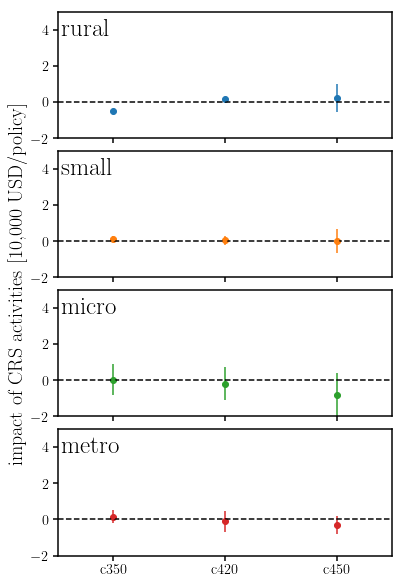

In [27]:
fig = plt.figure(figsize=(6,10))

mu_dYs, sig_dYs = [], []
for i_arch, arch in enumerate(['rural', 'small', 'micro', 'metro']): 
    sub = fig.add_subplot(4,1,i_arch+1)
    
    codes = [rural_codes, small_codes, micro_codes, metro_codes][i_arch]
    fids  = [rural_fids, small_fids, micro_fids, metro_fids][i_arch]
    dfids = [rural_dfids, small_dfids, micro_dfids, metro_dfids][i_arch]
    
    dYs = [] 
    for ii, code, fid, dfid in zip(np.arange(len(codes)), codes, fids, dfids): 
        dYs.append(np.array(treatment_effect(code, fid, dfid, nsample=10000)[-3:]))
    dYs = np.array(dYs)
    
    not_zero = np.all(dYs != 0., axis=1)
    _mu_dYs, _sig_dYs = [], []
    for _i in range(3): 
        #not_zero = (dYs[:,_i] != 0.)
        sub.errorbar([_i], np.mean(dYs[:,_i][not_zero], axis=0)/1e4, 
                     yerr=np.std(dYs[:,_i][not_zero], axis=0)/1e4, fmt='.C%i' % i_arch)    
        sub.scatter([_i], np.mean(dYs[:,_i][not_zero], axis=0)/1e4, c='C%i' % i_arch)    
        _mu_dYs.append(np.mean(dYs[:,_i][not_zero]))
        _sig_dYs.append(np.std(dYs[:,_i][not_zero]))
        
    mu_dYs.append(np.array(_mu_dYs))
    sig_dYs.append(np.array(_sig_dYs))
    
    sub.text(0.01, 0.95, arch, transform=sub.transAxes, ha='left', va='top', fontsize=25)
    sub.axhline(0., color='k', linestyle='--')    
    sub.set_xlim(-0.5, 2.5)
    sub.set_xticks(np.arange(3))
    sub.set_xticklabels([])
    sub.set_ylim(-2., 5.)
    
mu_dYs = np.array(mu_dYs)
sig_dYs = np.array(sig_dYs)
    
sub.set_xticklabels(['c350', 'c420', 'c450'])
fig.subplots_adjust(hspace=0.1)

fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel("impact of CRS activities [10,000 USD/policy]", fontsize=20)

np.save('dYs.c350c420c450.npy', mu_dYs)
np.save('sig_dYs.c350c420c450.npy', sig_dYs)

In [28]:
mu_dYs_binary = np.load('dYs.binary.npy')
sig_dYs_binary = np.load('sig_dYs.binary.npy')

/opt/anaconda3/envs/noah/lib/python3.7/site-packages/matplotlib/axes/_axes.py:3411: RuntimeWarning: invalid value encountered in double_scalars
  low = [v if lo else v - e for v, e, lo in zip(data, a, lolims)]
/opt/anaconda3/envs/noah/lib/python3.7/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


Text(0, 0.5, 'impact of CRS activities [10,000 USD/policy]')

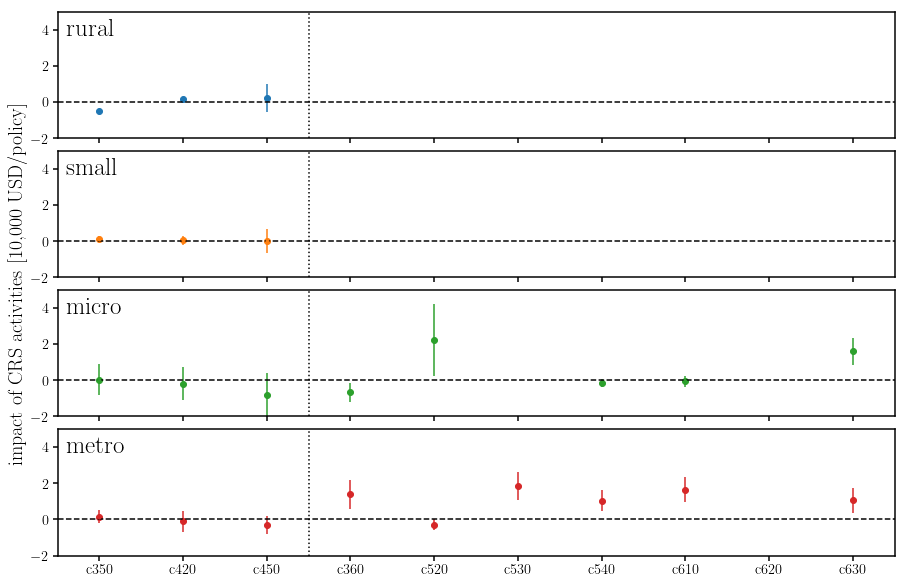

In [29]:
fig = plt.figure(figsize=(15,10))

for i_arch, arch in enumerate(['rural', 'small', 'micro', 'metro']): 
    sub = fig.add_subplot(4,1,i_arch+1)
    
    sub.errorbar(np.arange(3), mu_dYs[i_arch]/1e4, yerr=sig_dYs[i_arch]/1e4, fmt='.C%i' % i_arch)    
    sub.scatter(np.arange(3),  mu_dYs[i_arch]/1e4, c='C%i' % i_arch)  
    
    sub.errorbar(np.arange(3, 10), mu_dYs_binary[i_arch]/1e4, yerr=sig_dYs_binary[i_arch]/1e4, fmt='.C%i' % i_arch)    
    sub.scatter(np.arange(3, 10),  mu_dYs_binary[i_arch]/1e4, c='C%i' % i_arch)    
    
    sub.text(0.01, 0.95, arch, transform=sub.transAxes, ha='left', va='top', fontsize=25)
    sub.axhline(0., color='k', linestyle='--')    
    sub.set_xlim(-0.5, 9.5)
    sub.set_xticks(np.arange(10))
    sub.set_xticklabels([])
    sub.set_ylim(-2., 5.)
    sub.axvline(2.5, color='k', linestyle=':')
    
sub.set_xticklabels(['c350', 'c420', 'c450'] + binary_activities)
fig.subplots_adjust(hspace=0.1)

fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel("impact of CRS activities [10,000 USD/policy]", fontsize=20)